[The latest version on a Colab notebook here](https://colab.research.google.com/drive/1rKEkwQaaUI71etntOM-nuT3rU6IVpbtg)

**To run below, please remember to define** ```folder```

In [ ]:
folder =  # your local path to the original data files primary.csv, etc.







INTERACTIVE = 1 # Colab vs [Kaggle]
INTERACTIVE = 2 # [Colab] vs Kaggle

In [ ]:
!pip install lifelines scikit-survival optuna wget sentence-transformers

In [ ]:
# needed when cleaning narratives
!python -m spacy download en_core_web_lg

In [ ]:
import spacy
nlp = spacy.load( 'en_core_web_lg' )

In [ ]:
import sksurv    
from time import time
from sentence_transformers import SentenceTransformer # emb 1-3
import tensorflow_hub as hub # emb=4

import numpy as np
import pandas as pd
import polars as pol

import plotly.express as px

import multiprocessing as mp
from multiprocessing import Pool    

from tqdm import tqdm 
from datetime import date
today = date.today()

import pickle, json, wget

from pathlib import Path

from sklearn.model_selection import GridSearchCV, KFold
from sklearn.exceptions import FitFailedWarning
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler


from sklearn.model_selection import GridSearchCV, KFold
from sklearn.exceptions import FitFailedWarning
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from pathlib import Path

import scipy
from sksurv.metrics import *

from spellchecker import SpellChecker
spellchecker = SpellChecker()
from spacytextblob.spacytextblob import SpacyTextBlob
nlp.add_pipe('spacytextblob')

# Part 1: Load and merge two dataframes into a single cohort

... and map their numeric data values to strings.


In [ ]:
def get_data( folder = '../input/neiss-2023' ):

    with Path( folder + "variable_mapping.json").open("r") as f:
        mapping = json.load(f, parse_int=True)

    for c in mapping.keys():
        mapping[c] = {int(k): v for k, v in mapping[c].items()}

    df = pd.read_csv(folder+"primary_data.csv", parse_dates=['treatment_date'],
                   dtype={"body_part_2": "Int64", "diagnosis_2": "Int64", 'other_diagnosis_2': 'string'} )

    df2 = pd.read_csv(folder+"supplementary_data.csv",  parse_dates=['treatment_date'],
                    dtype={"body_part_2": "Int64", "diagnosis_2": "Int64", 'other_diagnosis_2': 'string' } )

    org_columns = df2.columns 
    df['source']=1     
    df2['source']=2     
        
    merged_df = pd.concat( (df, df2)) #, left_on='cpsc_case_number', right_on='cpsc_case_number', how='outer' )    
    merged_df.drop_duplicates( inplace=True )
    merged_df.reset_index( inplace=True )

    primary_cid = merged_df.iloc[ np.where( merged_df.source==1)[0],: ].cpsc_case_number    
    supp_cid    = merged_df.iloc[ np.where( merged_df.source==2)[0],: ].cpsc_case_number    
    
    trn_case_nums = np.intersect1d( primary_cid, supp_cid )
    tst_case_nums = np.setdiff1d( supp_cid, primary_cid )

    print( 'Trn:Tst ratio:', len(trn_case_nums)/ len(tst_case_nums),  )
        
    def add_cols( df2 ):
        
        df2['month'] = df2.treatment_date.dt.month
        df2['year'] = df2.treatment_date.dt.year

        '''
        0. Not stated
        1. White: A person having origins in any of the Europe, Middle East, or North Africa.
        2. Black/African American: A person having origins in any of the black racial groups of Africa.
        3. ED record indicates more than one race (e.g., multiracial, biracial)
        4. Asian: A person having origins in any of the original peoples of the Far East, Southeast Asia, or the Indian subcontinent
        5. American Indian/Alaska Native: A person having origins in any of the original peoples of North and South America (including Central America), and who maintains tribal affiliation or community attachment.
        6. Native Hawaiian/Pacific Islander: A person having origins in any of the original peoples of Hawaii, Guam, Samoa, or other Pacific Islands.
        7. White Hispanic 1 Race=1
        8. Black Hispanic 1 Race=2        
        '''

        k = 'race_white'
        df2[k] = 0 # non-white 
        q=np.where( df2['race'] == 0 )[0]
        df2.loc[ q, k] = -1 # not stated 
        q=np.where( df2['race'] == 1 )[0]
        df2.loc[ q, k] = 1   

        k = 'race_4'
        df2[k] = 0 # non-white 
        q=np.where( df2['race'] == 0 )[0]
        df2.loc[ q, k] = -1
        q=np.where( df2['race'] == 4 )[0]
        df2.loc[ q, k] = -2
        q=np.where( df2['race'] == 1 )[0]
        df2.loc[ q, k] = 1   
                
        df2['race_recoded'] = 0
        df2['race_recoded'] = df2['race'].copy()
        q=np.where( (df2['hispanic'] == 1 ) & (df2['race'] == 1) )[0]
        df2.loc[q, 'race_recoded'] = 7
        q=np.where( (df2['hispanic'] == 1 ) & (df2['race'] == 2) )[0]
        df2.loc[q, 'race_recoded'] = 8
        
        df2['severity'] = df2['disposition'].copy() 
        df2['severity'].replace( {9: np.nan, 6: 1, 5:2,  1:3,  2:4 ,  4:5,  8: 6 }, inplace=True)
        
        df2['age_cate']= 0
        df2['age_cate']= pd.cut(
        df2.age,
        bins=[0,65,75,85,95,150],
        labels=["1: 65 or under", "2: 65-74", "3: 74-85", "4: 85-94", "5: 95+"],
        )

        df2['age_cate'] = pd.Categorical(df2.age_cate).copy() 
        df2['age_cate_binned'] = df2.age_cate.cat.codes

        # drop the 3 cases of unknown sex and then map codes to English words
        df2 = df2[df2.sex != 0]
        return df2
    
    # add variables
    merged_df = add_cols( merged_df )    
        
    for col in mapping.keys():        
        if col != 'disposition':
            merged_df[col] = merged_df[col].map(mapping[col])
         
    return merged_df, org_columns, trn_case_nums, tst_case_nums, mapping



def load_decoded( folder = '../input/neiss-2023'):    

    decoded_df2=pd.read_csv( folder + 'decoded_df2_unique.csv')

    decoded_df2.sex = (decoded_df2.sex == 'MALE').astype(int)
    for k in [ 'alcohol','fire_involvement','drug', ]:
        decoded_df2[k] = ( decoded_df2[k] == 'Yes').astype(int)    
    dic = {}
    for k in [ 'location','product_1','product_2','product_3','body_part','body_part_2' ]:
        dic[k] = {k: { i:l for l,i in enumerate( decoded_df2[k].unique() ) } }
        decoded_df2.replace( dic[k], inplace=True )  

    def add_race_categories( df2 ):
        df2.reset_index(inplace=True)
        k = 'race_white'
        df2[k] = 0 # non-white 
        q=np.where( df2['race'] == 'N.S.' )[0]
        df2.loc[ q, k] = -1 # not stated 
        q=np.where( df2['race'] == 'WHITE' )[0]
        df2.loc[ q, k] = 1   
    
        k = 'race_4'
        df2[k] = 0 # non-white 
        q=np.where( df2['race'] == 'N.S.' )[0]; print(len(q))    
        df2.loc[ q, k] = -1
        q=np.where( df2['race'] == 'ASIAN' )[0]; print(len(q))
        df2.loc[ q, k] = -2
        q=np.where( df2['race'] == 'WHITE' )[0]; print(len(q))
        df2.loc[ q, k] = 1   
        return df2
    decoded_df2 = add_race_categories(decoded_df2 )
    print( 'race=white?', decoded_df2['race_white'].unique() ) #check 

    return decoded_df2





LOAD_ALL = 0
if LOAD_ALL: 
    _, org_columns, trn_case_nums, tst_case_nums, mapping = get_data( folder )
    decoded_df2.to_csv('decoded_df2__l1.csv')    
    decoded_df2=decoded_df2.drop_duplicates('cpsc_case_number')
    decoded_df2.to_csv('decoded_df2_unique.csv')
else:    
    decoded_df2 = load_decoded( folder )
       
        


In [ ]:
# variables to use in subsequent analyses

att =['location','product_1','product_2','product_3','fire_involvement','body_part','drug','alcohol', 'sex', 'age_cate_binned','race_recoded','year','month']

# Part 2: Use multiprocessing to clean each narrative

In [ ]:
def rid_typos( r ):
    r=r.replace('TWO','2').replace('TWPO','2').replace('TW D','2 D')
    r=r.replace('FIOUR DAYS AGO', 'FOUR DAYS AGO').replace('6X DAYS','6 DAYS').replace('4 FDAYS','4 DAYS').replace('FOOUR DAYS','4 DAYS')
    r=r.replace('SIX','6').replace('SEVEN','7').replace('THREE','3').replace('ONE','1').replace('FOUR','4').replace('FIVE','5').replace(')','')
    r=r.replace('TEN','10').replace('NINE','9').replace('24 HOURS AGO','1 DAY AGO').replace('EIGHT','8').replace('E DAYS AGO','8').replace('A DAY','1 DAY')
    r=r.replace('ELEVEN','11').replace('TWELVE','12').replace('HRS', 'HOURS').replace('HR AGO', 'HOUR AGO').replace(' F DAYS AGO', ' FEW DAYS AGO')
    r=r.replace('SEVERALDAYS', 'SEVERAL DAYS').replace('2 AND A HALF','2.5').replace('2 AND HALF','2.5').replace('5 DADAYS','5 DAYS')
    r=r.replace('2HOURS','2 HOURS').replace('1HOUR','1 HOUR').replace('AN HOUR','1 HOUR').replace('FERW HOUR','FEW HOUR')
    r=r.replace('2,DAYS', '2 DAYS').replace('SEV DAYS', 'SEVERAL DAYS')
    r=r.replace('COUPLEOF','COUPLE OF').replace('A DAY','1 DAY').replace('HALF HOUR','1 HOUR') # round to 1 hour
    r=r.replace('   ',' ').replace('  ',' ').replace('DAYSA GO', 'DAYS AGO').replace('witho ','with')
    r=r.replace('LAST MIGHT AND', 'LAST NIGHT AND').replace('AT NH','AT NURSING HOME').replace(' BAKC ', ' BACK ')
    r=r.replace('DXZ','DX').replace('10NIS', 'TENNIS').replace('N/S INJURY', 'NOT SIGNIFICANT INJURY')
    r=r.replace('***','*').replace('**','*').replace('>>>','>').replace('>>','>').replace('...','.').replace('..','.')
    r=r.replace('&','and').replace("@", "at").replace('+', ' ').replace('--','. ')
    r=r.replace('VERTABRA','VERTEBRA').replace('+LOCDX','LOC DX').replace(' ONTPO ', ' ONTO ').replace(' STAT ES ', ' STATES ')
    return r

abbr_terms = {
      "abd": "abdomen", # "af": "accidental fall",
      "afib": "atrial fibrillation",
      "aki": "acute kidney injury",
      "am": "morning", #"a.m.": "morning",
      "ams": "ALTERED mental status",
      "bac": "BLOOD ALCOHOL CONTENT",
      "bal": "BLOOD ALCOHOL LEVEL",
      "biba": "brought in by ambulance",
      "c/o": "complains of",
      "chi": "CLOSED head injury",
      "clsd hd": "CLOSED head",
      "clsd": "CLOSED",
      "cpk": "creatine phosphokinase",
      "cva": "cerebral vascular accident", # stroke
      "dx": "diagnosis",
      "ecf": "EXTENDED CARE FACILITY",
      "elf": "EXTENDED CARE FACILITY",
      "er": "emergency room",
      "ed": "emergency room",
      "etoh": "ETHYL ALCOHOL",
      "eval": "evaluate", # "fd": "fall detected",
      "fxs": "fractures",  # "glf": "ground level fall",
      "fx": "fracture",
      "h/o": "history of", # "htn": "hypertension",
      "hx": "history of",
      "inj": "injury",
      "inr": "INR",  # "international normalized ratio": special type of measurement; keep abbv to retain clinical meaning ==> capitalize
      "intox": "intoxication",
      "lac": "lacerations",
      "loc": "loss of consciousness", # capitalize so that "left" will be ignored by lemmatizer, rather than convert to "leave" (present tense of "left")
      "mech": "mechanical",
      "mult": "multiple",
      "n.h.": "NURSING HOME",
      "nh": "NURSING HOME",
      "p/w": "presents with",
      "pm": "afternoon",
      "pt": "patient", # "p.m.": "afternoon",
      'prev': "previous",
      "pta": "prior to arrival",
      "pts": "patient's", # "px": "physical examination", # not "procedure", "r": "right", "l": "left",
      "r/o": "rules out",
      "rt": "right",
      "s'dandf": "slipped and fell",
      "s'd&f": "slipped and fell",
      "t'd&f": "tripped and fell", "t'dandf": "tripped and fell",
      "tr": "trauma",
      "s/p": "after",
      "rt.": "right",
      "lt.": "LEFT",
      "lt": "LEFT",
      "sah": "subarachnoid hemorrhage",
      "sdh": "acute subdural hematoma",
      "sts": "sit-to-stand",
      "uti": "UTI", # "urinary tract infection",
      "unwit'd": "unwitnessed",
      "w/": "with",
      "w": "with",
      "w/o": "without",
      "wks": "weeks"
    }

def strip_basic_info( r ):
    for a in ['YOF', 'YO FEMALE', 'Y/O FEMALE', 'YO F', 'YF', 'Y O F', 'YOM', ' YWF',
              'YO MALE', 'YO M', 'Y O M', 'YM', 'Y/O WM',
              'Y/O MALE' , 'Y/O M', 'OLD FE', 'OLD MALE ', 'FEMALE', 'MALE']:
        try:
            r = r.split(a[:10])[1]
            break
        except:
            pass
    if r.find('DX')>-1:
        parts=r.split('DX')
    elif r.find('>')>-1:
        parts=r.split('>')
    else:
        parts=r.split('*')
    try:
        dx = parts[1]
    except:
        dx = '' # assumed not narrated
    return parts[0], dx

def lemmatizer(narrative:str) -> str:
    doc = nlp(narrative)
    p = doc._.blob.polarity
    s = doc._.blob.subjectivity
    return " ".join([token.lemma_ for token in doc ]), p, s

def fix_missing_sp( text ):
    def try_find(u): # ------- helper, exhaustive search
        m=-1
        for i in range(len(u),1,-1):
            a = u[:i].split()
            b = spellchecker.unknown( a )
            if (len(b)==0):
                m=i
                break
        if m>-1:
            u=f'{u[:m]} {u[m:]}'
            return u
        else:
            return u
    text  = text.replace('.',' ').replace(',', ' ')
    wlist = text.split()
    un=spellchecker.unknown( wlist )
    for u in un:
        text=text.replace(u, try_find(u))
    return text


def _clean_narrative(text0):    # Step 1) rid of typos
    text = rid_typos( text0 )

    # Step 2) strip off demo graphic info + diagnosis
    text, dx = strip_basic_info( text )
    dx = dx.replace('*',' ').replace('LBP','low back pain')

    # Step 3)
    text += ' ' # add char space to end so that step 5 will not ignore words immediately followed by period

    # Step 4) lowercase and add char spaces so not interprettted as spelling errors
    text = text.lower().replace(',',' ').replace('.',' .')

    # Ack: https://www.drivendata.org/competitions/217/cdc-fall-narratives/community-code/50/
    #
    # Changes need: special words are capitalized "CLOSED" "LEFT" to prevent lemmatization
    #
    # Step 5) map abbrevations back to English words;
    for term, replacement in abbr_terms.items():
        text = text.replace( f' {term} ', f' {replacement} ' )
    '''
    lemmatization:
    - nursing home stays same
    - turned -> turn
    - sitting on chair, sit on chair
    - reaching -> reach
    - striking -> strike
    ''';
    # Step 6) lemmatization
    text, pol, subj = lemmatizer(text)

    # Step 7)  try to fix missing char space
    text = fix_missing_sp( text.lower() )

    # sentences = sent_tokenizer.tokenize(text) # no effect besides compute load
    return text, dx, pol, subj






DEMO=1
if DEMO:
    # just a demo
    sample = decoded_df2.iloc[3::70000,:].copy()
    with mp.Pool(mp.cpu_count()) as pool:
        sample_narr_cleaned = pool.map( _clean_narrative, sample['narrative'] )

    for a,b in zip(sample['narrative'], sample_narr_cleaned):
        print(a, '\n', b[0], '\n\tDX:', b[1], '\n\tpolarity:', b[2], '\n\tsubjectivity:', b[3])


In [ ]:
def get_cleaned_narratives( dff ):
    with mp.Pool(mp.cpu_count()) as pool:
        res =  pool.map( _clean_narrative, dff['narrative'] )
    A = [ r[0] for r in res ]
    B = [ r[1] for r in res ]
    P = [ r[2] for r in res ]
    S = [ r[3] for r in res ]
    dff['narrative_cleaned']= A
    dff['narrative_dx'] = B
    dff['narrative_pol']= P
    dff['narrative_sub'] = S
    return dff

decoded_df2 = get_cleaned_narratives( decoded_df2 )

print( decoded_df2['narrative'][100] )
print( decoded_df2['narrative_cleaned'][100])

decoded_df2.to_csv('decoded_df2_unique_cleaned.csv')

# Part 3: Extract word embeddings using 5 different model types

In [ ]:
if ('Embeddings' in globals())==False:    
    cpcs_nums = decoded_df2.cpsc_case_number
    size_n = decoded_df2.shape[0]    
    Embeddings={}

def embed(model, model_type, sentences):
    """
    wrapper function for generating word embeddings using methods 1-4
    """
    if model_type == 'use':
        embeddings = model(sentences)
    elif model_type == 'sentence transformer':
        embeddings = model.encode(sentences)

    return embeddings

# ======== https://github.com/huggingface/transformers/issues/15038 
class NoDaemonProcess( mp.Process):
    @property
    def daemon(self):
        return False
    @daemon.setter
    def daemon(self, value):
        pass
class NoDaemonContext(type( mp.get_context("fork"))):
    Process = NoDaemonProcess
        
# =================================== called when using LEALLA ===================================
import torch                                            
from transformers import pipeline
from torch.multiprocessing import Pool, Process, set_start_method
from transformers import BertModel, BertTokenizerFast           
name = "setu4993/LEALLA-small"
def get_pipe():
    tokenizer = BertTokenizerFast.from_pretrained(name)
    model =  BertModel.from_pretrained(name)
    model = model.eval()  
    return tokenizer, model
def compute( inp ):
    tokenizer, model = get_pipe()                    
    #print(len(inp), end=f' {inp}', )
    english_inputs = tokenizer(inp, return_tensors="pt", padding=True)

    with torch.no_grad():
        english_outputs = model(**english_inputs)
    r = np.array( english_outputs.pooler_output )    
    return r
# ==================================================================================================


for src in [ 'narrative_cleaned']: 
    for emb in EMB:            
        if 1:            
            if INTERACTIVE:        
                inp = decoded_df2[src][:30] 
            else:
                inp =  decoded_df2[src]  
            if 'cleaned' not in src:        
                inp = inp.str.lower()
            inp = list(inp)

            starttime=time()                       
            
            if emb<4: 
                

                if emb==1:# 768
                    model = SentenceTransformer('all-mpnet-base-v2')
                elif emb==2: # 384
                    model = SentenceTransformer('all-MiniLM-L6-v2')
                elif emb==3: #768
                    model = SentenceTransformer('paraphrase-mpnet-base-v2')  # already explored paraphrase-multilingual-mpnet-base-v2")

            elif emb==4: # 512                
                
                # Daniel Cer, Yinfei Yang, Sheng-yi Kong, Nan Hua, Nicole Limtiaco, Rhomni St. John, Noah Constant, Mario Guajardo-Céspedes, Steve Yuan, Chris Tar, Yun-Hsuan Sung, Brian Strope, Ray Kurzweil. 
                # Universal Sentence Encoder. arXiv:1803.11175, 2018.
                module_url = "https://tfhub.dev/google/universal-sentence-encoder/4"         
                model = hub.load(module_url)       
            
            elif emb==6:                                  
                multi_pool = Pool(processes=3)
                predictions = multi_pool.map( compute, inp)                 
                multi_pool.close()
                multi_pool.join()                
                Embeddings[emb]=np.array(predictions).squeeze()
                
        if emb<5:            
            Embeddings[emb] = embed( model, inp, TF_MODEL )            

        exec_time = (time() - starttime)/60 

        d=Embeddings[emb].shape[1]
        print(d,'dimensions')

        pref = f'{src}_n{size_n}_emb{emb}_d{d}_{today}'
        f = open( pref+'.txt' ,'w')
        f.write( 'Finished in %2.f minutes'%exec_time )
        f.close()

        with open( pref+'.pkl', 'wb') as handle:
            pickle.dump( {"embeddings": Embeddings[emb] } , handle)   
        print('src', emb, 'done in ', exec_time, 'written to', pref )                          


# Part 4

In [5]:
%%time

# Defining the time instances to evaluate the survival models

labels = ['3h','6h','9h','12h','15h','18h', '24h','2d','3d','1w','2w','1mo']

def time2events_n_split_ds( df2 ):
    df2 = df2.filter((pol.col('narrative').str.contains(' LAST ')|
                     pol.col('narrative').str.contains('MORNING')|
                     pol.col('narrative').str.contains('A.M.',literal=True, strict=True )|
                     pol.col('narrative').str.contains('P.M.',literal=True, strict=True )|
                     pol.col('narrative').str.contains('AFTERNOON')|
                     pol.col('narrative').str.contains(' DAY')|
                     pol.col('narrative').str.contains('TODAY') |
                     pol.col('narrative').str.contains('EARLIER TONIGHT') |
                     pol.col('narrative').str.contains('AROUND') |
                     pol.col('narrative').str.contains('YESTERDAY') |
                     pol.col('narrative').str.contains(' AGO') )&
                   ~(
                    pol.col('narrative').str.contains("LAST 2 STEPS", literal=True) |
                    pol.col('narrative').str.contains("LAST FEW STEP", literal=True) |
                    pol.col('narrative').str.contains("LAST STAIR", literal=True) |
                    pol.col('narrative').str.contains("LAST SEV STEP", literal=True) |
                    pol.col('narrative').str.contains("LAST STEP", literal=True) |
                    pol.col('narrative').str.contains("YR AGO", literal=True) |
                    pol.col('narrative').str.contains("YRS AGO", literal=True) |
                    pol.col('narrative').str.contains("YEAR AGO", literal=True) |
                    pol.col('narrative').str.contains("YEARS AGO", literal=True)
                   ))
    k  = 'narrative'
    kk = 'time2hosp_1'
    df = df2.with_columns( pol.col("treatment_date").str.to_datetime().dt.weekday().alias("weekday") )
    
    df = df.with_columns(pol.when(
      pol.col(k).str.contains('SEVERAL HOUR') |
      pol.col(k).str.contains('SEV HOUR', literal=True, strict=True) |
      pol.col(k).str.contains('SEV. HR', literal=True, strict=True) |
      pol.col(k).str.contains('SEV. HOUR', literal=True, strict=True)
      ).then(5).otherwise(np.nan).alias( 'a' ))
    df = df.with_columns(pol.when(
      pol.col(k).str.contains('SEVERAL DAY') | pol.col('narrative_cleaned').str.contains('several day') |
      pol.col(k).str.contains('SEV DAY') |
      pol.col(k).str.contains('SEVRAL DAY')|
      pol.col(k).str.contains('SEV. D')
      ).then(5*24).otherwise(np.nan).alias('d' ))
    df = df.with_columns(pol.when(
      pol.col(k).str.contains('SEVERAL WK') |
      pol.col(k).str.contains('SEV. WEEKS') |
      pol.col(k).str.contains('SEVERAL WEEK')|
      pol.col(k).str.contains('SEV. WK') |
      pol.col(k).str.contains('SEV WK')
      ).then(5*7*24).otherwise(np.nan).alias('y' ))

    df = df.with_columns(pol.when(
        pol.col(k).str.contains('COUPLE HOUR') | pol.col(k).str.contains('COUPLE OF HOUR')
      ).then(3).otherwise(np.nan).alias( 'c' ))
    df = df.with_columns(pol.when(
        pol.col(k).str.contains('COUPLE DAY') | pol.col(k).str.contains('COUPLE OF DAY') | pol.col(k).str.contains('3 NITES AGO')
      ).then(3*24).otherwise(np.nan).alias( 'f'))

    df = df.with_columns(pol.when(
        pol.col(k).str.contains('FEW HOUR')
      ).then(4).otherwise(np.nan).alias( 'b' ))
    df = df.with_columns(pol.when(
        pol.col(k).str.contains('FEW DAY') | pol.col(k).str.contains('FEW NIGHT') |  pol.col(k).str.contains('FEW NITE')
      ).then(4*24).otherwise(np.nan).alias( 'e' ))
    df = df.with_columns(pol.when(
        pol.col(k).str.contains('FEW HOUR')
      ).then(4).otherwise(np.nan).alias( 'ee' ))
    df = df.with_columns(pol.when(
        pol.col(k).str.contains('FEW WEEK')
      ).then(4*7*24).otherwise(np.nan).alias( 'eee' ))
    df = df.with_columns(pol.when(
        pol.col(k).str.contains('OTHER DAY')
      ).then(9*24).otherwise(np.nan).alias( 'eeee' ))

    df = df.with_columns(pol.when(
      pol.col(k).str.contains('LAST MTH')  | pol.col(k).str.contains('LAST MONTH')
      ).then(30*24).otherwise(np.nan).alias( 'g' ))
    
    df = df.with_columns(pol.when(
      pol.col(k).str.contains('PREVIOUS DAY') | pol.col(k).str.contains('PREV DAY') |
      pol.col(k).str.contains('YESTERDAY') | pol.col(k).str.contains('LAST AM')    | pol.col(k).str.contains('LAST PM') |
      pol.col(k).str.contains('LAST EVEN') | pol.col(k).str.contains('DAY BEFORE') |
      pol.col(k).str.contains('LAST NOC')  | pol.col(k).str.contains('LAST NIGHT') | pol.col(k).str.contains('LAST NITE') | pol.col(k).str.contains('LAST NGHT')
      ).then(28).otherwise(np.nan).alias( 'g' ))

    df = df.with_columns(pol.when(
      pol.col(k).str.contains('P.M.', literal=True, strict=True ) |
      pol.col(k).str.contains('THIS AFTERNOON') | pol.col(k).str.contains('THIS EVEN') | pol.col(k).str.contains('TONIGHT')
      ).then(9).otherwise(np.nan).alias( 'h' ))

    df = df.with_columns(pol.when(
        pol.col(k).str.contains('A.M.', literal=True, strict=True )|
      pol.col(k).str.contains('MORNING', literal=True, strict=True )
      ).then(12).otherwise(np.nan).alias( 'i' ))

    df = df.with_columns(pol.when(
        pol.col(k).str.contains('THIS MORNING') |pol.col(k).str.contains('THIS AM') | pol.col(k).str.contains('TDY')|
        pol.col(k).str.contains('TODAY')
      ).then(12).otherwise(np.nan).alias( 'j' ))

    df = df.with_columns(pol.when(
        pol.col(k).str.contains('LAST EVE') | pol.col(k).str.contains('LAST NGIHT') |  pol.col(k).str.contains('AROUND MIDNIGHT') |
        pol.col(k).str.contains('LAST WK') | pol.col(k).str.contains('LAST MIGHT') | pol.col(k).str.contains('LAST WEEK') | pol.col(k).str.contains('WK AGO')
      ).then(10.5*7).otherwise(np.nan).alias( 'k' ))

    df = df.with_columns(pol.when(
        pol.col('narrative_cleaned').str.contains('1 day',literal=True, strict=True)
      ).then(24).otherwise(np.nan).alias( 'x'))

    df = df.with_columns(pol.when(
        pol.col('narrative_cleaned').str.contains('1+ day',literal=True, strict=True)
      ).then(36).otherwise(np.nan).alias( 'xx'))

    df = df.with_columns(pol.when(
        pol.col('narrative_cleaned').str.contains('an hour') | pol.col('narrative_cleaned').str.contains('a hour')|
        pol.col('narrative_cleaned').str.contains('1 hour')
      ).then(1).otherwise(np.nan).alias( 'am'))

    df = df.with_columns(pol.when(
        pol.col(k).str.contains('LAST MOND') | pol.col(k).str.contains('MONDAY')
      ).then( pol.col('weekday')+7 ).otherwise(np.nan).alias( '1' ))
    df = df.with_columns(pol.when(
        pol.col(k).str.contains('LAST TUE') | pol.col(k).str.contains('TUESDAY')
      ).then(pol.col('weekday')+6).otherwise(np.nan).alias( '2' ))
    df = df.with_columns(pol.when(
        pol.col(k).str.contains('LAST WED') | pol.col(k).str.contains('WEDNESDAY')
      ).then(pol.col('weekday')+5).otherwise(np.nan).alias( '3' ))
    df = df.with_columns(pol.when(
        pol.col(k).str.contains('LAST THU') | pol.col(k).str.contains('THURSDAY')
      ).then(pol.col('weekday')+4).otherwise(np.nan).alias( '4' ))
    df = df.with_columns(pol.when(
        pol.col(k).str.contains('LAST FRI') | pol.col(k).str.contains('FRIDAY')
      ).then(pol.col('weekday')+3).otherwise(np.nan).alias( '5' ))
    df = df.with_columns(pol.when(
        pol.col(k).str.contains('LAST SAT') | pol.col(k).str.contains('SATURDAY')
      ).then(pol.col('weekday')+2).otherwise(np.nan).alias( '6' ))
    df = df.with_columns(pol.when(
        pol.col(k).str.contains('LAST SUN') | pol.col(k).str.contains('SUNDAY')
      ).then(pol.col('weekday')+1).otherwise(np.nan).alias( '7' ))
    df = df.with_columns(pol.when(
        pol.col('narrative_cleaned').str.contains('1 mon')  | pol.col('narrative_cleaned').str.contains('a mon')
      ).then(24*30).otherwise(np.nan).alias( 'ba'))
    df = df.with_columns(pol.when(
        pol.col('narrative_cleaned').str.contains('2 month')
      ).then(24*60).otherwise(np.nan).alias( 'bb'))
    df = df.with_columns(pol.when(
        pol.col('narrative_cleaned').str.contains('3 month')
      ).then(24*90).otherwise(np.nan).alias( 'bc'))
    df = df.with_columns(pol.when(
        pol.col('narrative_cleaned').str.contains('4 month')
      ).then(24*120).otherwise(np.nan).alias( 'bd'))

    df = df.with_columns(pol.when(
        pol.col('narrative_cleaned').str.contains('1 week')  | pol.col('narrative_cleaned').str.contains('a week')
      ).then(24*7).otherwise(np.nan).alias( 'be'))
    df = df.with_columns(pol.when(
        pol.col('narrative_cleaned').str.contains('2 week')
      ).then(24*14).otherwise(np.nan).alias( 'bf'))
    df = df.with_columns(pol.when(
        pol.col('narrative_cleaned').str.contains('3 week')
      ).then(24*21).otherwise(np.nan).alias( 'bg'))
    df = df.with_columns(pol.when(
        pol.col('narrative_cleaned').str.contains('4 week')
      ).then(24*28).otherwise(np.nan).alias( 'bh'))
    df = df.with_columns(pol.when(
        pol.col('narrative_cleaned').str.contains('5 week')
      ).then(24*35).otherwise(np.nan).alias( 'bi'))

    df = df.with_columns(pol.when(
      pol.col('narrative').str.contains('SEVERAL MONTH') |
      pol.col('narrative').str.contains('SEV MON') |
      pol.col('narrative').str.contains('5 MOS AGO')
      ).then(24*7*4*5).otherwise(np.nan).alias( 'bj'))

    k='narrative'
    for n in range(30):
        df = df.with_columns(pol.when(
          pol.col(k).str.contains(f'{n}D AGO') |
          pol.col(k).str.contains(f'{n} DAY') |  pol.col('narrative_cleaned').str.contains(f'{n} day') |
          pol.col(k).str.contains(f'{n}DAY')
      ).then(n*24).otherwise(np.nan).alias( f'd{n}' ))

    k='narrative'
    for n in range(24):
        df = df.with_columns(pol.when(
        pol.col(k).str.contains(f'AROUND {n}:') |pol.col(k).str.contains(f'AROUND {n}:') |
        pol.col(k).str.contains(f'AROUND {n} AM') | pol.col(k).str.contains(f'AROUND {n} PM')
      ).then(24).otherwise(np.nan).alias( f'time{n}' ))

    k='narrative_cleaned'
    for n in range(6): # ================ Month
        df = df.with_columns(pol.when(
        pol.col(k).str.contains(f'{n} mth')
      ).then(n*30*24).otherwise(np.nan).alias( f'n{n}' ))

    for n in range(10): # ================ weeks
        df = df.with_columns(pol.when(
          pol.col(k).str.contains(f'{n} wk',literal=True, strict=True ) | pol.col(k).str.contains(f'{n}wk',literal=True, strict=True ) |
          pol.col(k).str.contains(f'{n} week',literal=True, strict=True ) | pol.col(k).str.contains(f'{n}week',literal=True, strict=True ) |
          pol.col('narrative').str.contains(f'{n}WEEK',literal=True, strict=True ) |
          pol.col('narrative').str.contains(f'{n}WKS AGO',literal=True, strict=True ) |
          pol.col(k).str.contains(f'{n}weeks ago' ) |
          pol.col('narrative').str.contains(f'{n} WEEK',literal=True, strict=True )
      ).then(n*7*24).otherwise(np.nan).alias( f'n{n}' ))

    for n in range(30): # ================ DAY
        df = df.with_columns(pol.when(
      pol.col(k).str.contains(f'{n}night') |
      pol.col(k).str.contains(f'{n} night') |pol.col(k).str.contains(f'{n} d ago') |
      pol.col(k).str.contains(f'{n} day') | pol.col(k).str.contains(f'{n} dy ago') |
      pol.col(k).str.contains(f'{n}day')
      ).then(n*24).otherwise(np.nan).alias( f'n{n}' ))

    for n in range(50): # ================ HOUR
        df = df.with_columns(pol.when(
          pol.col(k).str.contains('hour ago') |
          pol.col(k).str.contains(f'{n} hour') |
          pol.col(k).str.contains(f'{n}hour') |
          pol.col('narrative').str.contains(f'{n} HOURS AGO') |
          pol.col(k).str.contains(f'{n}hrs ago') |
          pol.col(k).str.contains(f'{n}h ago')
      ).then(n).otherwise(np.nan).alias( f'h{n}' ))

    for n in range(90): # ================ minutes
        df = df.with_columns(pol.when(
        pol.col(k).str.contains(f'{n} minute') | pol.col(k).str.contains(f'{n} min ago')
      ).then(n/60).otherwise(np.nan).alias( f'm{n}' ))

    for n in range(90): # ================ minutes
        df = df.with_columns(pol.when(
        pol.col('narrative').str.contains(f'{n} MIN')
      ).then(n/60).otherwise(np.nan).alias( f'M{n}' ))

    rr=-119-90-140
    print( 'Sample size:', df.shape, df[:,rr:].head() )
    time2hosp=np.nanmax( df[:,rr:].to_numpy(),1 )
    df = df.with_columns(pol.lit(time2hosp).alias('time2hosp'))
    p  = df.filter( pol.col( 'time2hosp') .is_nan() )

    print( '\n\n',p.shape , 'remaining')
    for r in p.sample(5).iter_rows():
        print( r[3], )
        print( r[31], '\n' )

    p2 = df.filter( pol.col( 'time2hosp') >0 )
    trn_df = p2.filter( pol.col('cpsc_case_number').is_in( trn_case_nums ) )
    tst_df = p2.filter( pol.col('cpsc_case_number').is_in( tst_case_nums ) )
    print( trn_df.shape[0],'dev samples', tst_df.shape[0], 'test samples' )

    surv_pols = {}
    surv_pols['trn'] = trn_df[0::2,:]
    surv_pols['val'] = trn_df[1::2,:]
    surv_pols['tst'] = tst_df
        
    return surv_pols

if ( 'surv_pols' in globals()) ==False:
    surv_pols = time2events_n_split_ds( pol.DataFrame( decoded_df2 ) )



CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.2 µs


In [ ]:
# case numbers per subset, for convenience

cnums={}
for t in ['trn','val','tst']:
    cnums[t]=np.array(surv_pols[t].select('cpsc_case_number') )
    
# clean up

decoded_df2.drop('Unnamed: 0', axis=1, inplace=True )
decoded_df2.drop('Unnamed: 0.1', axis=1, inplace=True )
decoded_df2.drop('level_0', axis=1, inplace=True )
decoded_df2['cpsc_num'] = decoded_df2.cpsc_case_number.copy()
decoded_df2.set_index('cpsc_num',inplace=True)
decoded_df2.head()

Model==============
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 46)]              0         
                                                                 
 dense (Dense)               (None, 64)                3008      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 64)                0         
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 32)                0         
                                                                 
 dropout_1 (Dropout)         (None, 32)  

46it [00:02, 16.51it/s]


HEAD 43613
NECK 278
13335/13335 [==============================] - 21s 1ms/step


NameError: name 'px' is not defined

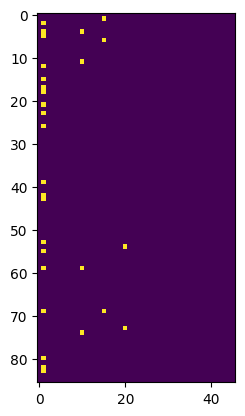

In [6]:
%%time

import matplotlib.pyplot as plt
%matplotlib inline

import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

import time
import numpy as np
import scipy.io as sio
from imblearn.over_sampling import RandomOverSampler
from sklearn.metrics import confusion_matrix

### Tensorflow 2.0 version
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Flatten, Dropout
from tensorflow.keras import losses, optimizers, metrics
from tensorflow.keras import regularizers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint

### Define models
def define_model(input_size=46, learning_rate=1e-2):
    input_data = Input(shape=(input_size, ))

    ### Model (Region 46)
    x = Dense(64, kernel_regularizer=regularizers.l2(0.0001), kernel_initializer=tf.random_normal_initializer(stddev=0.01))(input_data)
    x = keras.layers.LeakyReLU(alpha=0.1)(x)
    x = Dropout(rate=0.5)(x)
    x = Dense(32, kernel_regularizer=regularizers.l2(0.0001))(x)
    x = keras.layers.LeakyReLU(alpha=0.1)(x)
    x = Dropout(rate=0.2)(x)
    x = Dense(1, activation='sigmoid')(x)

    model = Model(inputs=input_data, outputs=x)
    model.compile(optimizer=optimizers.Adam(lr=learning_rate), loss=losses.binary_crossentropy)

    print('Model==============')
    model.summary()
    
    !wget -O Model_Region46.h5 https://raw.githubusercontent.com/HeewonChung92/AIS/main/Model_Region46.h5
    model.load_weights( 'Model_Region46.h5')
    
    return model


def get_ais():

    def process_dx( df, N=0 ):    
        bb = pol.DataFrame( df )
        bb = bb.with_columns(pol.col("narrative").str.replace_all( r"(?i)>>|SUSTAINED| D X*|DX:|DX.|DZ:|DZ.|\b\/|\b-\b", ' DX. ').alias('processed'))
        bb = bb.with_columns(pol.col("processed").str.replace_all( '(>)(>)', ' DX. '))
        bb = bb.with_columns(pol.col("processed").str.replace_all( ',,', ' DX. '))
        bb = bb.with_columns(pol.col("processed").str.replace_all( '/', ' DX. '))                                                 
        if N>0:
            a = bb.filter( ~pol.col('processed').str.contains('DX.') )
            print(a.shape[0]/bb.shape[0], 'of samples do not have Dx info;', 1- a.shape[0]/bb.shape[0]  )
            for i, r in enumerate( np.array(a.sample(N) ) ):
                print(i,r[5], '\n\t', r[-1].lower() )  
        return bb

    decoded_pol = process_dx(decoded_df2.copy(), 20 ) 

    k='processed'
    def get_dx( df ):
        diag_pols = (
            df.with_row_count('id').with_columns(pol.col(k).str.split( "DX.").alias("split_str"))
            .explode("split_str")
            .with_columns(
                ("string_" + pol.arange(0, pol.count()).cast(pol.Utf8).str.zfill(2))
                .over("id")
                .alias("col_nm")
            )
            .pivot(
                index=['id', k],
                values='split_str',
                columns='col_nm',
            )
            .with_columns(
                pol.col('^string_.*$').fill_null("")
            )
        )        
        return diag_pols    
    
    dx_pol = get_dx( decoded_pol )
    #dx_pol.head(1)
    
    from tqdm import tqdm    
    try:
        ais_df=pd.read_excel('AIS_codes.xlsx',sheet_name='SimpleCodingBook')
    except:
        !wget -O AIS_codes.xlsx https://static-content.springer.com/esm/art%3A10.1038%2Fs41598-021-03024-1/MediaObjects/41598_2021_3024_MOESM2_ESM.xlsx
        ais_df=pd.read_excel('AIS_codes.xlsx',sheet_name='SimpleCodingBook')
        
    for i, kk in tqdm(enumerate(ais_df['Region-46']) ):
        k=kk.upper()
        dx_pol = dx_pol.with_columns(pol.when(    
        pol.col('string_01').str.contains(k) |
        pol.col('string_02').str.contains(k) |
        pol.col('string_03').str.contains(k) |
        pol.col('string_04').str.contains(k) |
        pol.col('string_05').str.contains(k) |
        pol.col('string_06').str.contains(k) |
        pol.col('string_07').str.contains(k) |
        pol.col('string_08').str.contains(k) |
        pol.col('string_09').str.contains(k) |
        pol.col('string_10').str.contains(k) |
        pol.col('string_11').str.contains(k) |
        pol.col('string_12').str.contains(k) 
          ).then(1).otherwise(0).alias( f'{k}' ))        
        
    ais_features = np.array(dx_pol[:,-46:] )
    
    # add more
    for k,c in zip(['HEAD','NECK'], [1,10]):
        i=np.array( 
            decoded_pol.filter( pol.col('processed').str.contains(f'INJURED {k}') | pol.col('processed').str.contains(f'{k} INJU') ).select('index') 
                  ) 
        print(k, len(i))
        ais_features[i, c] = 1 # head   

    plt.imshow(  np.array(ais_features[::5000,:]) )
    ais_scores = ais_model.predict( ais_features )
     
    return ais_scores, ais_scores.squeeze()  

if DEFN==3:
    try:
        ais_model
    except:    
        ais_model = define_model()    
        ais_scores, ais_scores = get_ais()            
    try:    
        px.histogram( ais_scores[0] )
        ais_dif = pd.DataFrame( dict( cpsc_nums= decoded_df2.index, ais_scores=ais_scores ) )     
        px.histogram( ais_scores[0] >0.04 )        
    except:
        pass
    

# Define t2event given "timed" cohort

In [7]:
def get_surv( dff, DEFN = 2 ):            
    from sksurv.util import Surv
    ev,time,surv_inter,surv_str={},{},{},{}
    
    if DEFN==1:
        thres=3 # treated
    elif DEFN==2:
        thres=5 # hosp/ died
    
        
    for t in ['trn','val','tst']:        
        df=dff[t].to_pandas()
        surv_inter[t]=pd.DataFrame( {'label_lower_bound': df['time2hosp'] ,
                                     'label_upper_bound': df['time2hosp'] } )
        
        if DEFN==3:
            q=np.where(  df['severity'] < thres )[0] # unseen + observed
            ev[t] = ( df['severity'] >= thres ).values    
        else:
            q=np.where(  df['severity'] < thres )[0] # unseen + observed
            ev[t] = ( df['severity'] >= thres ).values    

        surv_inter[t].iloc[q, 1] = np.inf         
        print(t, np.sum(ev[t])/ len(ev[t]), 'n=',len(ev[t]) )
        time[t] = ( df['time2hosp']  ).values
        
        surv_str[t]=Surv.from_arrays(ev[t], time[t])
    return ev, time, surv_inter, surv_str

event_indicator, time2event, surv_inter, surv_str = get_surv( surv_pols, DEFN=2 )

trn 0.33886255924170616 n= 5064
val 0.33846761453396523 n= 5064
tst 0.34009177748642067 n= 21356


In [8]:
mapping['body_part']

{0: '0 - INTERNAL',
 30: '30 - SHOULDER',
 31: '31 - UPPER TRUNK',
 32: '32 - ELBOW',
 33: '33 - LOWER ARM',
 34: '34 - WRIST',
 35: '35 - KNEE',
 36: '36 - LOWER LEG',
 37: '37 - ANKLE',
 38: '38 - PUBIC REGION',
 75: '75 - HEAD',
 76: '76 - FACE',
 77: '77 - EYEBALL',
 78: '78 - UPPER TRUNK(OLD)',
 79: '79 - LOWER TRUNK',
 80: '80 - UPPER ARM',
 81: '81 - UPPER LEG',
 82: '82 - HAND',
 83: '83 - FOOT',
 84: '84 - 25-50% OF BODY',
 85: '85 - ALL PARTS BODY',
 86: '86 - OTHER(OLD)',
 87: '87 - NOT STATED/UNK',
 88: '88 - MOUTH',
 89: '89 - NECK',
 90: '90 - LOWER ARM(OLD)',
 91: '91 - LOWER LEG(OLD)',
 92: '92 - FINGER',
 93: '93 - TOE',
 94: '94 - EAR'}

In [9]:
# define severity 
import plotly.express as px
t='trn'; 
px.histogram( decoded_df2.loc[cnums[t].squeeze() ], x='body_part' )

In [10]:
# define severity !?

import plotly.express as px
t='trn'; 
px.histogram( decoded_df2.loc[cnums[t].squeeze() ], x='diagnosis' )

In [11]:
# define severity !?

import plotly.express as px
t='trn'; 
px.histogram( decoded_df2.loc[cnums[t].squeeze() ], x='disposition' )

In [12]:
'''
1: unseen
2: observed
3: treated
4: reated
5: admitted/hospitalized <- 
6: died
''';

# Load embeddings


In [13]:
%%time 

EMB=[1,2,3,4]
def get_embeddings( EMB, src ):            
       
    Embeddings={}    
    if 'cleaned' in src:
        # cpsc_nums = indices not unique and hence 533518 
        files = ['', 
                 '/kaggle/input/neiss-emb-cleaned-1-2/all_embeddings_1.pkl',
                 '/kaggle/input/neiss-emb-cleaned-1-2/all_embeddings_2.pkl',
                 '/kaggle/input/neiss-emb-cleaned-3-4/all_embeddings_3.pkl',
                 '/kaggle/input/neiss-emb-cleaned-3-4/all_embeddings_4.pkl'
                ]        
        with open( f"../input/neiss-emb-cleaned-1-2/all_cpsc.pkl", 'rb') as handle:
            x=pickle.load(handle)
        cpcs_nums= x['cpsc']
        
    else:            
        files =['', 'narrative_n426691_emb1_d768_2023-10-02.pkl', 'narrative_n426691_emb2_d384_2023-10-02.pkl',
            '/kaggle/input/n-raw-extract-3/narrative_n426691_emb3_d768_2023-10-03.pkl', 'narrative_n426691_emb4_d512_2023-10-02.pkl' ]
                
    for emb in EMB:        
        def read( file ):
            print( file )
            with open( file, 'rb') as handle:                      
                x=pickle.load(handle)                
            if emb==4:
                x=x['embeddings'].numpy()
            else:
                x=x['embeddings']
            return x 

        x = read( files[emb] )
        X = pd.DataFrame( np.hstack((np.expand_dims(cpcs_nums,1), x )))                        
        X = X.drop_duplicates(0)    
        X.set_index(0,inplace=True)                        
        
        for t in ['trn','val','tst']:            
            c = surv_pols[t].to_pandas()['cpsc_case_number']          
            Xs = X.loc[c]                
            Embeddings[emb,t] = Xs    
            print(emb, t, Xs.shape)
    return Embeddings,cpcs_nums
        
Embeddings, cpcs_nums = get_embeddings( EMB, src )

/kaggle/input/neiss-emb-cleaned-1-2/all_embeddings_1.pkl
1 trn (5064, 768)
1 val (5064, 768)
1 tst (21356, 768)
/kaggle/input/neiss-emb-cleaned-1-2/all_embeddings_2.pkl
2 trn (5064, 384)
2 val (5064, 384)
2 tst (21356, 384)
/kaggle/input/neiss-emb-cleaned-3-4/all_embeddings_3.pkl
3 trn (5064, 768)
3 val (5064, 768)
3 tst (21356, 768)
/kaggle/input/neiss-emb-cleaned-3-4/all_embeddings_4.pkl
4 trn (5064, 512)
4 val (5064, 512)
4 tst (21356, 512)
CPU times: user 6.7 s, sys: 21 s, total: 27.7 s
Wall time: 1min 1s


In [14]:
for t in ['trn','val','tst']:
    s= np.array( surv_pols[t].select( 'year' )) - 2013       
    #surv_pols[t].with_columns( (pol.col('year')-pol.lit(2013) ).alias('year') )
    surv_pols[t].replace( 'year', pol.Series(s[:,0])  )
surv_pols[t].head()

/tmp/ipykernel_22/1153365919.py:4: DeprecationWarning:

`replace` is deprecated. DataFrame.replace is deprecated and will be removed in a future version. Please use
    df = df.with_columns(new_column.alias(column_name))
instead.



level_0,Unnamed: 0.1,Unnamed: 0,index,cpsc_case_number,narrative,treatment_date,age,sex,race,other_race,hispanic,diagnosis,other_diagnosis,diagnosis_2,other_diagnosis_2,body_part,body_part_2,disposition,location,fire_involvement,alcohol,drug,product_1,product_2,product_3,source,month,year,race_recoded,severity,age_cate,age_cate_binned,narrative_cleaned,narrative_dx,narrative_pol,narrative_sub,…,M54,M55,M56,M57,M58,M59,M60,M61,M62,M63,M64,M65,M66,M67,M68,M69,M70,M71,M72,M73,M74,M75,M76,M77,M78,M79,M80,M81,M82,M83,M84,M85,M86,M87,M88,M89,time2hosp
i64,i64,i64,i64,i64,str,str,i64,i64,str,str,str,str,str,str,str,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,f64,str,i64,str,str,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
115131,115131,115131,3,130107448,"""76 YOF CLOSED …","""2013-01-01""",76,0,"""N.S.""",null,null,"""62 - INTERNAL …",null,null,null,0,0,2,2,0,0,0,86,0,0,2,1,0,0,4.0,"""3: 74-85""",2,""" close head i…",null,0.157143,0.390476,…,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48.0
115175,115175,115175,47,130110877,"""80 YOF FRACTUR…","""2013-01-03""",80,0,"""N.S.""",null,null,"""57 - FRACTURE""",null,null,null,5,0,1,1,0,0,0,45,1,0,2,1,0,0,3.0,"""3: 74-85""",2,""" fractured lu…",null,0.2,0.6,…,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,96.0
115176,115176,115176,48,130110878,"""86 YOF CLOSED …","""2013-01-03""",86,0,"""N.S.""",null,null,"""62 - INTERNAL …",null,null,null,0,0,4,2,0,0,0,39,1,0,2,1,0,0,5.0,"""4: 85-94""",3,""" close head i…",null,-0.025,0.025,…,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,96.0
115178,115178,115178,50,130110905,"""67 YOF SPRAINE…","""2013-01-04""",67,0,"""N.S.""",null,null,"""64 - STRAIN, S…",null,null,null,7,0,1,2,0,0,0,6,22,0,2,1,0,0,3.0,"""2: 65-74""",1,""" sprain left …",null,-0.077778,0.144444,…,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.0
115179,115179,115179,51,130110923,"""68 YOM FRACTUR…","""2013-01-04""",68,1,"""N.S.""",null,null,"""57 - FRACTURE""",null,null,null,2,0,1,2,0,0,0,6,0,0,2,1,0,0,3.0,"""2: 65-74""",1,""" fractured ri…",null,0.065079,0.412302,…,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,72.0


In [15]:
'''
 
def get_cate_outcome( S ):
    scaler = StandardScaler()
    scaler.fit( S['trn'].to_pandas()[att] )
    S2={}
    for t in ['trn','val','tst']:                
        S2[t] = pd.DataFrame( scaler.transform( S[t][att] ), columns=att  )        
        S2[t]['year']= (S[t]['year']-2013)/9
        S2[t]['month']=S[t]['month']/12 
        S2[t]['time2hosp']=S[t]['time2hosp'] 
        S2[t]['outcome']=S[t]['severity'] > O
    return S2, scaler     
''';

# OpenAI embeddings

In [16]:
!wget -O openai.gzip https://s3.amazonaws.com/drivendata-public-assets/openai_embeddings_primary_narratives.parquet.gzip

--2023-10-06 21:30:38--  https://s3.amazonaws.com/drivendata-public-assets/openai_embeddings_primary_narratives.parquet.gzip
Resolving s3.amazonaws.com (s3.amazonaws.com)... 54.231.197.88, 52.217.124.192, 54.231.194.120, ...
Connecting to s3.amazonaws.com (s3.amazonaws.com)|54.231.197.88|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 742734124 (708M) [binary/octet-stream]
Saving to: ‘openai.gzip’

openai.gzip         100%[===================>] 708.33M  25.7MB/s    in 29s     

2023-10-06 21:31:07 (24.6 MB/s) - ‘openai.gzip’ saved [742734124/742734124]



In [17]:
openai_embeddings = pd.read_parquet("openai.gzip")
openai_embeddings.set_index('cpsc_case_number',inplace=True)

emb=11
for t in ['trn', 'val', ]:    
    s=openai_embeddings.loc[cnums[t].squeeze()]['embedding']
    Embeddings[emb,t]=np.reshape( np.concatenate(s.values).ravel(), (len(s),len(s.values[1]) )  )      
    assert (s.values[0] - np.reshape( np.concatenate(s.values).ravel(), (len(s),len(s.values[1]) )  )[0,:] ).sum() ==0
    print('loaded OpenAI embeddings')

loaded OpenAI embeddings
loaded OpenAI embeddings


In [18]:
emb = 6
def read_6():
    # Read in LEALLA embeddings
    try:
        cpcs_nums= decoded_df2.cpsc_case_number 
    except:
        cpcs_nums= decoded_df2.index
    emb = 6
    for d in range(20):
        files = ['/kaggle/input/neiss-lealla-small-0/narrative_cleaned_n426691_emb6_d0_2023-10-04.pkl',
        '/kaggle/input/neiss-lealla-small-0/narrative_cleaned_n426691_emb6_d1_2023-10-04.pkl',
        '/kaggle/input/neiss-lealla-small-1/narrative_cleaned_n426691_emb6_d2_2023-10-05.pkl',
        '/kaggle/input/neiss-lealla-small-1/narrative_cleaned_n426691_emb6_d3_2023-10-05.pkl',
        '/kaggle/input/neiss-lealla-small-2/narrative_cleaned_n426691_emb6_d4_2023-10-05.pkl',
        '/kaggle/input/neiss-lealla-small-2/narrative_cleaned_n426691_emb6_d5_2023-10-05.pkl',
        '/kaggle/input/neiss-lealla-small-3/narrative_cleaned_n426691_emb6_d6_2023-10-05.pkl',
        '/kaggle/input/neiss-lealla-small-3/narrative_cleaned_n426691_emb6_d7_2023-10-05.pkl',
        '/kaggle/input/neiss-lealla-small-4/narrative_cleaned_n426691_emb6_d8_2023-10-05.pkl',
        '/kaggle/input/neiss-lealla-small-4b/narrative_cleaned_n426691_emb6_d9_2023-10-05.pkl',
        '/kaggle/input/neiss-lealla-small-5/narrative_cleaned_n426691_emb6_d10_2023-10-05.pkl', 
        '/kaggle/input/neiss-lealla-small-5b/narrative_cleaned_n426691_emb6_d11_2023-10-05.pkl',
        '/kaggle/input/neiss-lealla-small-6/narrative_cleaned_n426691_emb6_d12_2023-10-05.pkl',
        '/kaggle/input/neiss-lealla-small-6/narrative_cleaned_n426691_emb6_d13_2023-10-05.pkl',
        '/kaggle/input/neiss-lealla-small-7a/narrative_cleaned_n426691_emb6_d14_2023-10-05.pkl',
        '/kaggle/input/neiss-lella-small-7b/narrative_cleaned_n426691_emb6_d15_2023-10-05.pkl',
        '/kaggle/input/neiss-lealla-small-8a/narrative_cleaned_n426691_emb6_d16_2023-10-05.pkl',
        '/kaggle/input/neiss-lealla-small-8b/narrative_cleaned_n426691_emb6_d17_2023-10-05.pkl',
        '/kaggle/input/neiss-lealla-small-9/narrative_cleaned_n426691_emb6_d18_2023-10-05.pkl',
        '/kaggle/input/neiss-lealla-small-9/narrative_cleaned_n426691_emb6_d19_2023-10-05.pkl' ]

        with open( files[d], 'rb') as handle:                      
            x=pickle.load(handle)                

        print('read embeddings', files[d] )

        x=x['embeddings']

        nfeats=x.shape[1]
        try:
            all_embeddings;
        except:
            all_embeddings = np.zeros( (decoded_df2.shape[0],nfeats) )

        all_embeddings[d::20,:] = x
        
    print( all_embeddings.shape )
    X = pd.DataFrame( np.hstack((np.expand_dims(cpcs_nums,1), all_embeddings )))                            
    X.set_index(0,inplace=True)                        
    for t in ['trn','val','tst']:            
        c = surv_pols[t].to_pandas()['cpsc_case_number']          
        Xs = X.loc[c]                
        Embeddings[emb,t] = Xs    
        print(emb, t, Xs.shape)
        
read_6()        

read embeddings /kaggle/input/neiss-lealla-small-0/narrative_cleaned_n426691_emb6_d0_2023-10-04.pkl
read embeddings /kaggle/input/neiss-lealla-small-0/narrative_cleaned_n426691_emb6_d1_2023-10-04.pkl
read embeddings /kaggle/input/neiss-lealla-small-1/narrative_cleaned_n426691_emb6_d2_2023-10-05.pkl
read embeddings /kaggle/input/neiss-lealla-small-1/narrative_cleaned_n426691_emb6_d3_2023-10-05.pkl
read embeddings /kaggle/input/neiss-lealla-small-2/narrative_cleaned_n426691_emb6_d4_2023-10-05.pkl
read embeddings /kaggle/input/neiss-lealla-small-2/narrative_cleaned_n426691_emb6_d5_2023-10-05.pkl
read embeddings /kaggle/input/neiss-lealla-small-3/narrative_cleaned_n426691_emb6_d6_2023-10-05.pkl
read embeddings /kaggle/input/neiss-lealla-small-3/narrative_cleaned_n426691_emb6_d7_2023-10-05.pkl
read embeddings /kaggle/input/neiss-lealla-small-4/narrative_cleaned_n426691_emb6_d8_2023-10-05.pkl
read embeddings /kaggle/input/neiss-lealla-small-4b/narrative_cleaned_n426691_emb6_d9_2023-10-05.pkl

In [19]:
EMB = [1,2,3,4,6,11]

# Visualize 2 dimensions of the dimensionally-reduced (via UMAP) word embeddings 

In [20]:
%%time

import umap
import seaborn as sns
import matplotlib.pyplot as plt

rs = 1119

dmeasure = 'euclidean' # distance metric

t ='trn'
# https://github.com/shap/shap/issues/2909
import warnings; warnings.filterwarnings("ignore", message=".*The 'nopython' keyword.*")
try:
    reducers;    
except:    
    reducers = {}
    for rdims in [2,3,4]: # use more than 2 dims per https://programminghistorian.org/en/lessons/clustering-visualizing-word-embeddings
        for e in EMB:
            reducers[e,rdims] = umap.UMAP(
            n_neighbors=25,
            min_dist=0.01,
            n_components=rdims,
            random_state=rs).fit( Embeddings[e,t] )
            print('Reducing word embedding', e, 'via UMAP')


/opt/conda/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning:

The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.

/opt/conda/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning:

The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.

/opt/conda/lib/python3.10/site-packages/umap/distances.py:1086: NumbaDeprecationWarning:

The 'nopython' keyword argument was not supplied to th

Reducing word embedding 1 via UMAP
Reducing word embedding 2 via UMAP
Reducing word embedding 3 via UMAP
Reducing word embedding 4 via UMAP
Reducing word embedding 6 via UMAP
Reducing word embedding 11 via UMAP
Reducing word embedding 1 via UMAP
Reducing word embedding 2 via UMAP
Reducing word embedding 3 via UMAP
Reducing word embedding 4 via UMAP
Reducing word embedding 6 via UMAP
Reducing word embedding 11 via UMAP
Reducing word embedding 1 via UMAP
Reducing word embedding 2 via UMAP
Reducing word embedding 3 via UMAP
Reducing word embedding 4 via UMAP
Reducing word embedding 6 via UMAP
Reducing word embedding 11 via UMAP
CPU times: user 4min 11s, sys: 1.6 s, total: 4min 13s
Wall time: 3min 59s


CPU times: user 9.59 s, sys: 1.3 s, total: 10.9 s
Wall time: 8.83 s


[None, None, None, None, None, None, None, None, None, None, None, None]

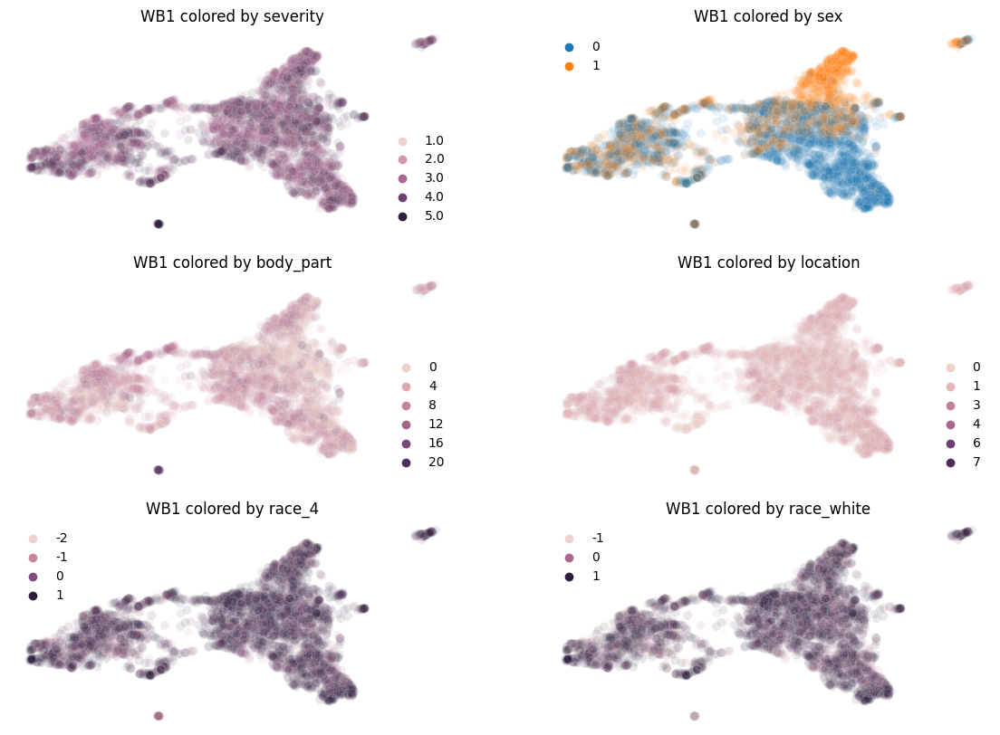

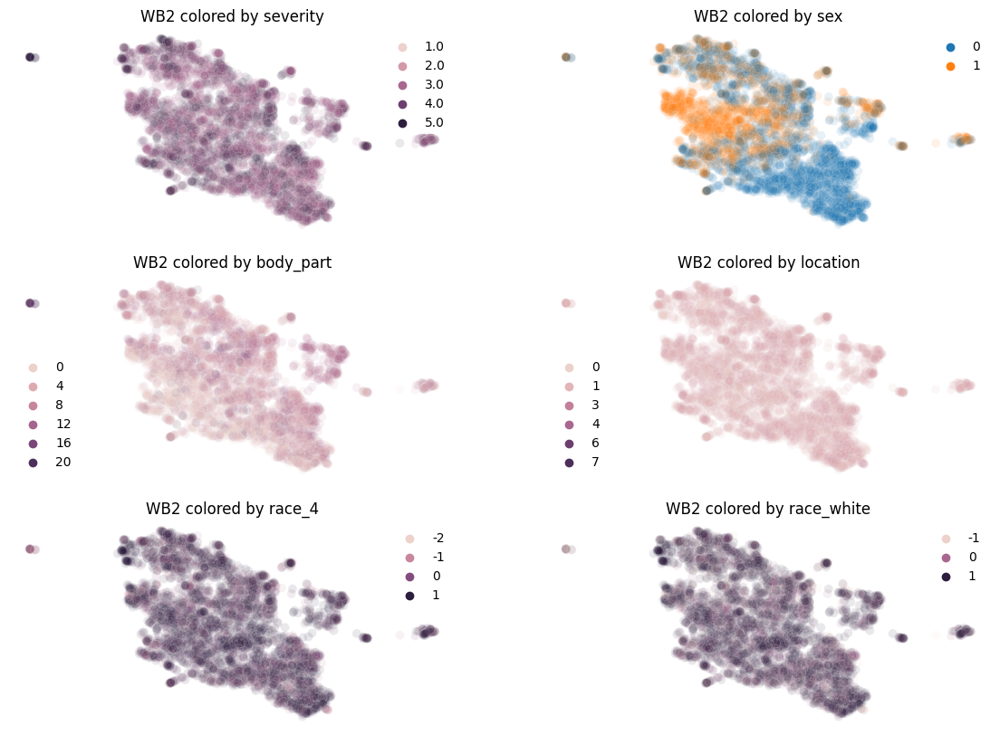

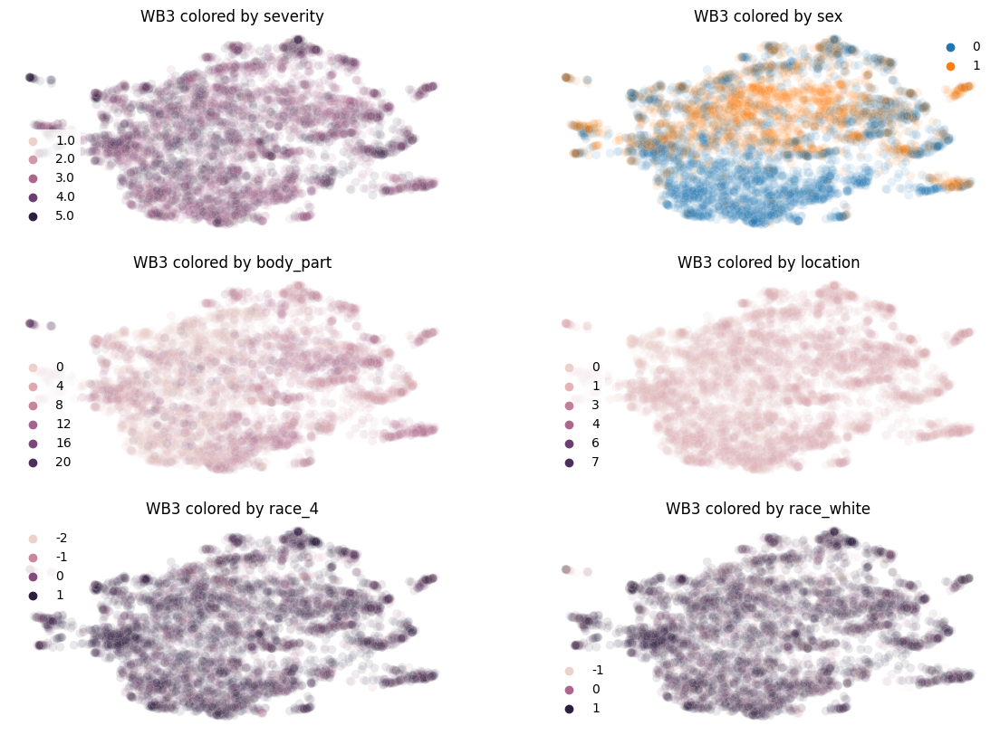

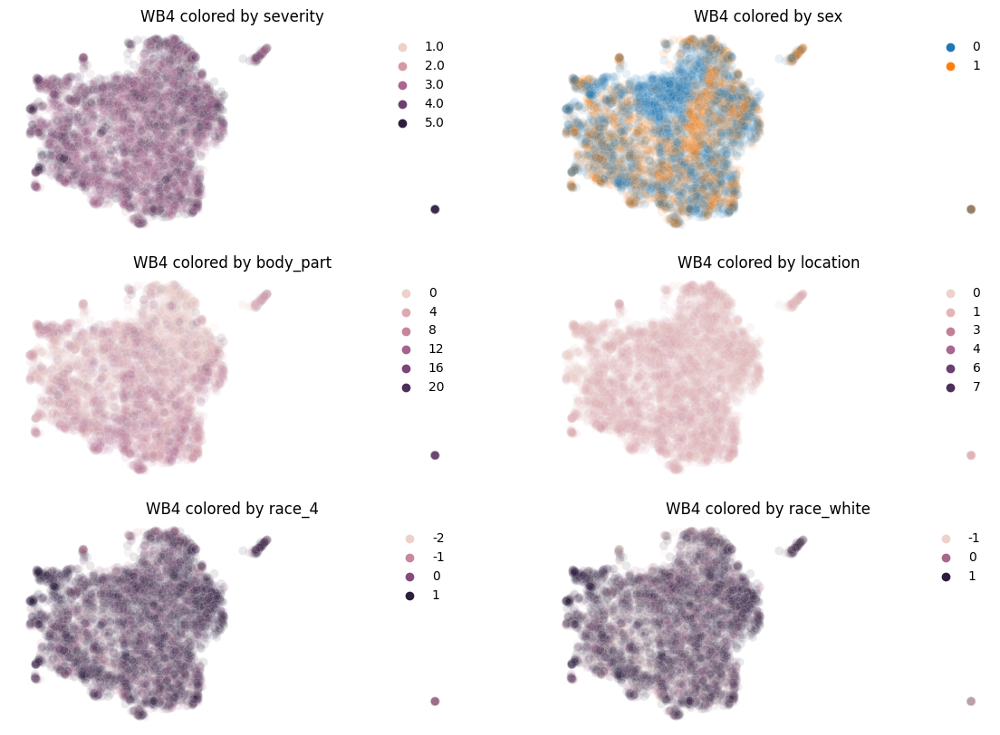

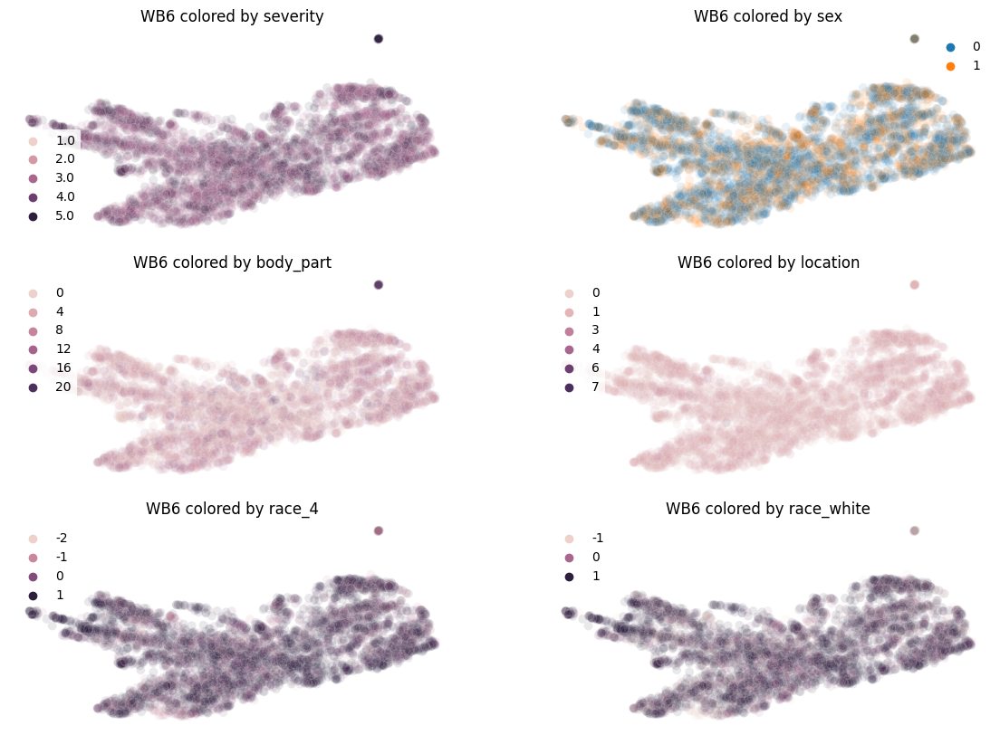

...

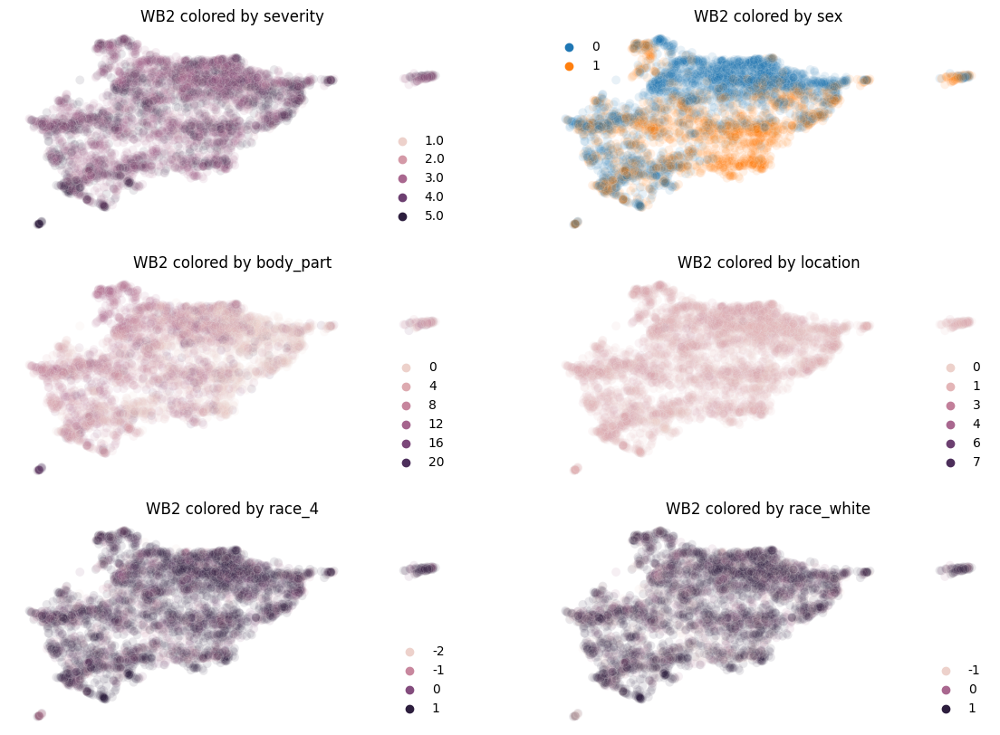

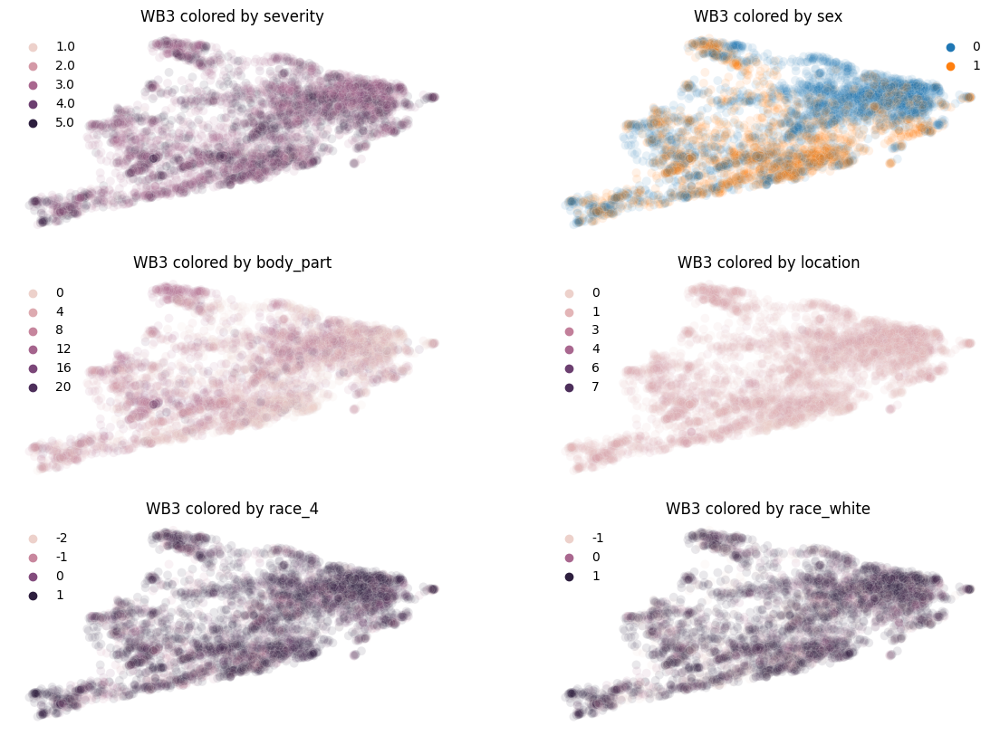

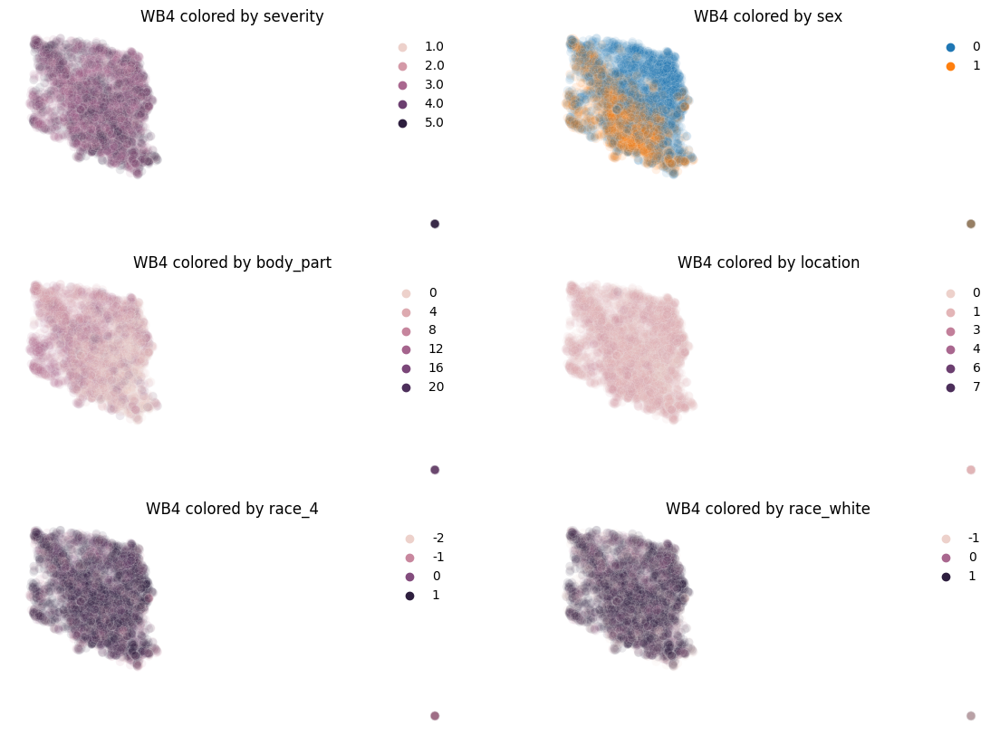

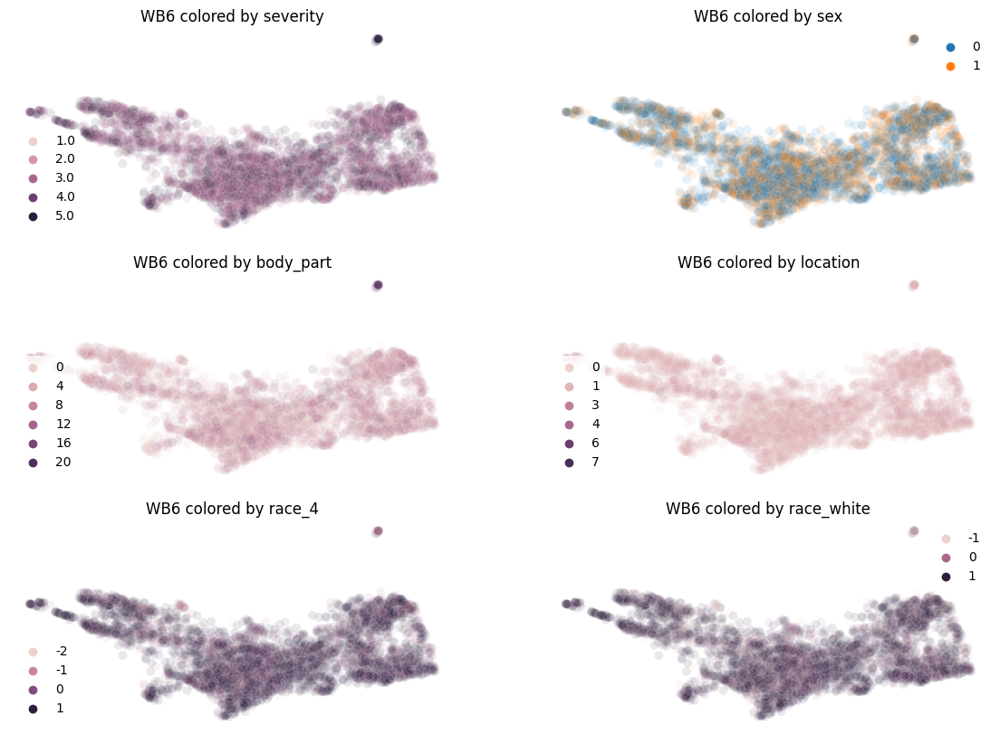

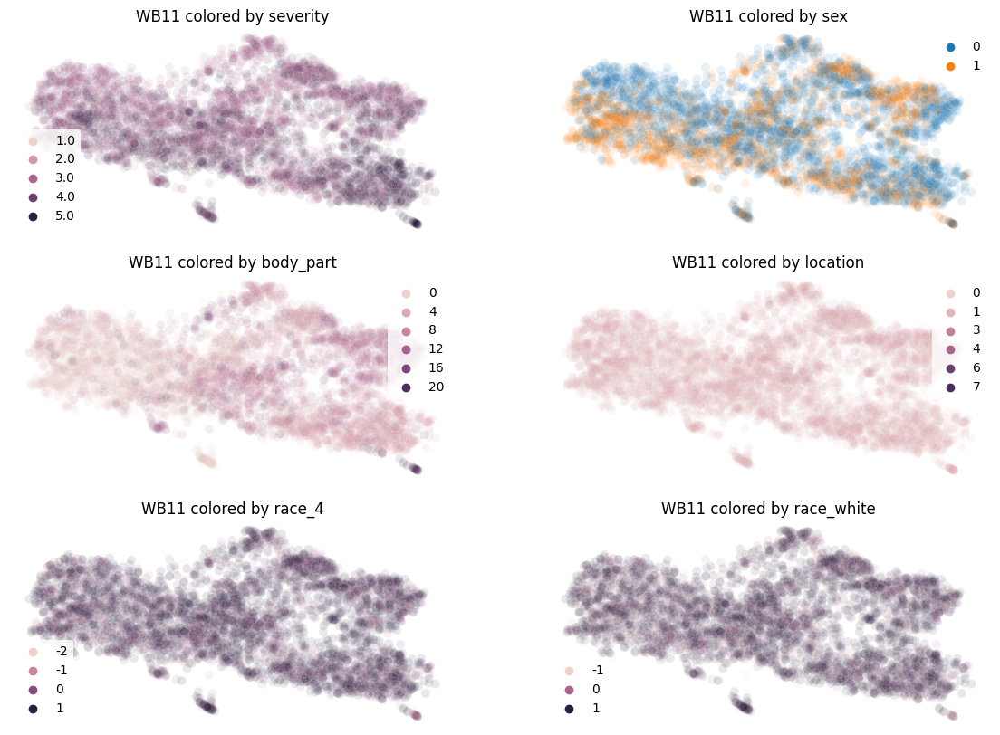

In [21]:
%%time

def show_umaps( mid, rdims ):    
    t='trn'
    
    X_embedded = reducers[mid,rdims].transform( Embeddings[mid,t]  ) 
    embedded_dict = {}
    for i in range(0,X_embedded.shape[1]):
        embedded_dict[f"Dim {i+1}"] = X_embedded[:,i] 
        
    projected = pd.DataFrame( embedded_dict )   
    projected['cids']= cnums[t]

    for k in ['sex', 'age_cate_binned','body_part','location', 'diagnosis','race_white','race_4', 'severity']:
        projected[k]= surv_pols[t].to_pandas()[k]
    
    fname = 'Arial Narrow'
    tfont = {'fontname':fname, 'fontsize':12} # title font attributes
    afont = {'fontname':fname, 'fontsize':10} # axis font attributes
    lfont = {'fontname':fname, 'fontsize':8}  # legend font attributes

    def tune_figure(ax, title:str='Title'):
        ax.axis('off')
        
        title =f'WB{mid} colored by {title}'
        ax.set_title(title, **tfont)
        ax.get_legend().set_title("")
        ax.get_legend().prop.set_family(lfont['fontname'])
        ax.get_legend().prop.set_size(lfont['fontsize'])
        ax.get_legend().get_frame().set_linewidth(0.0)

    f, axs = plt.subplots(3,2,figsize=(14,10))
    try:
        axs = axs.flatten()
    except:
        pass

    d,k=3,'location'
    sns.scatterplot(data=projected, x='Dim 1', y='Dim 2', hue=k, s=50, alpha=0.1, ax=axs[d]);
    tune_figure(axs[d], k)
    
    d,k=0,'severity'
    sns.scatterplot(data=projected, x='Dim 1', y='Dim 2', hue=k, s=50, alpha=0.1, ax=axs[d]);
    tune_figure(axs[d], k)
    d,k=1,'sex'
    sns.scatterplot(data=projected, x='Dim 1', y='Dim 2', hue=k, s=50, alpha=0.1, ax=axs[d]);
    tune_figure(axs[d], k)
    d,k=2,'body_part'
    sns.scatterplot(data=projected, x='Dim 1', y='Dim 2', hue=k, s=50, alpha=0.1, ax=axs[d]);
    tune_figure(axs[d], k)    
    
    d,k=4,'race_4'
    sns.scatterplot(data=projected, x='Dim 1', y='Dim 2', hue=k, s=50, alpha=0.1, ax=axs[d]);
    tune_figure(axs[d], k)
    
    d,k=5,'race_white'
    sns.scatterplot(data=projected, x='Dim 1', y='Dim 2', hue=k, s=50, alpha=0.1, ax=axs[d]);
    tune_figure(axs[d], k)    
    
    
# preliminary analysis  
[show_umaps( s, r ) for r in [2, 4] for s in EMB]    

CPU times: user 9.34 s, sys: 1.27 s, total: 10.6 s
Wall time: 8.66 s


[None, None, None, None, None, None, None, None, None, None, None, None]

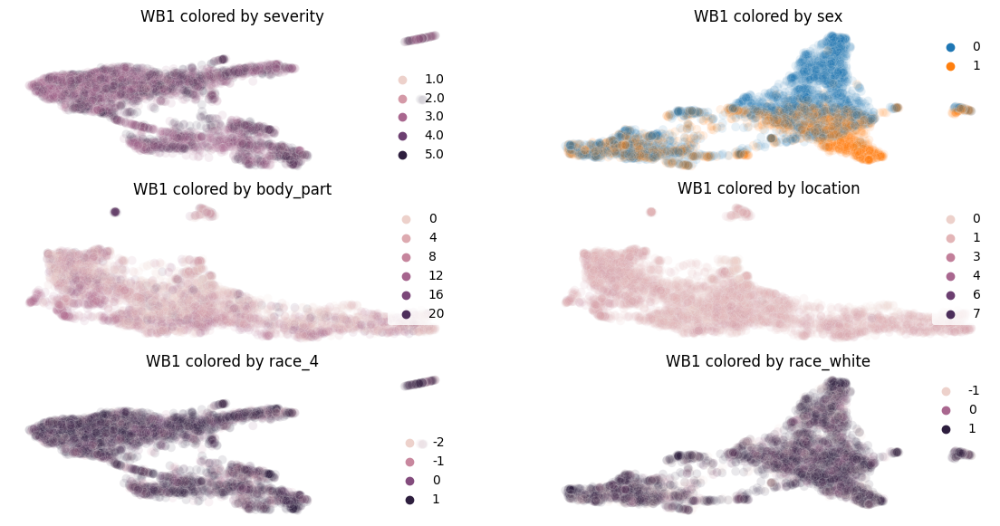

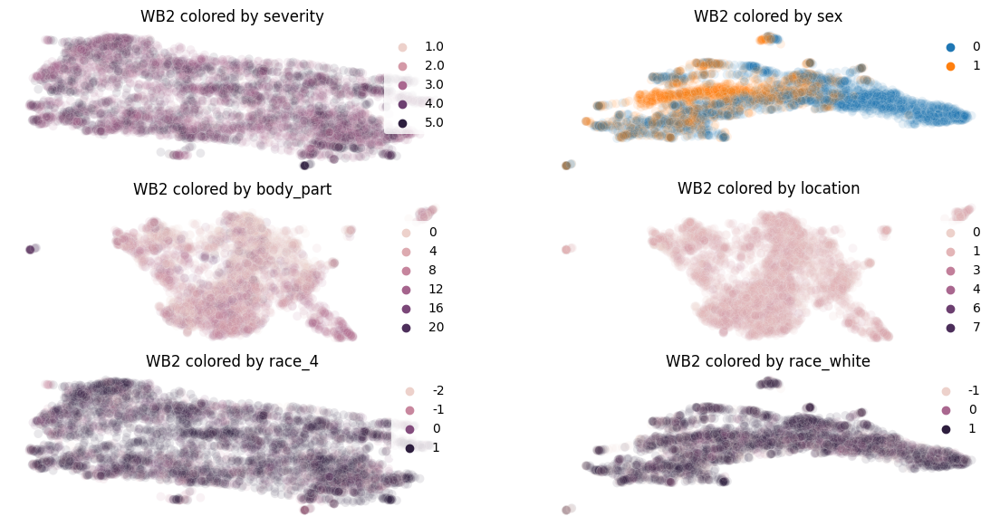

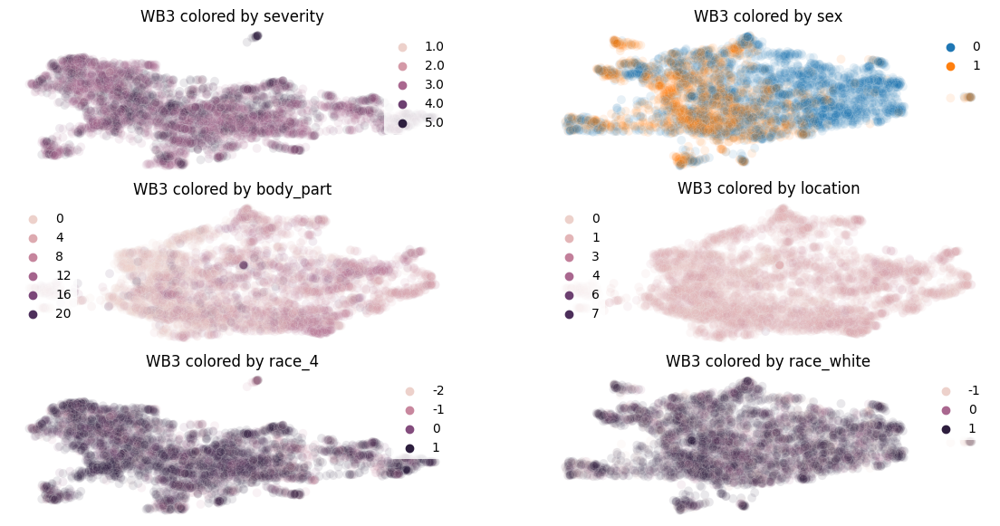

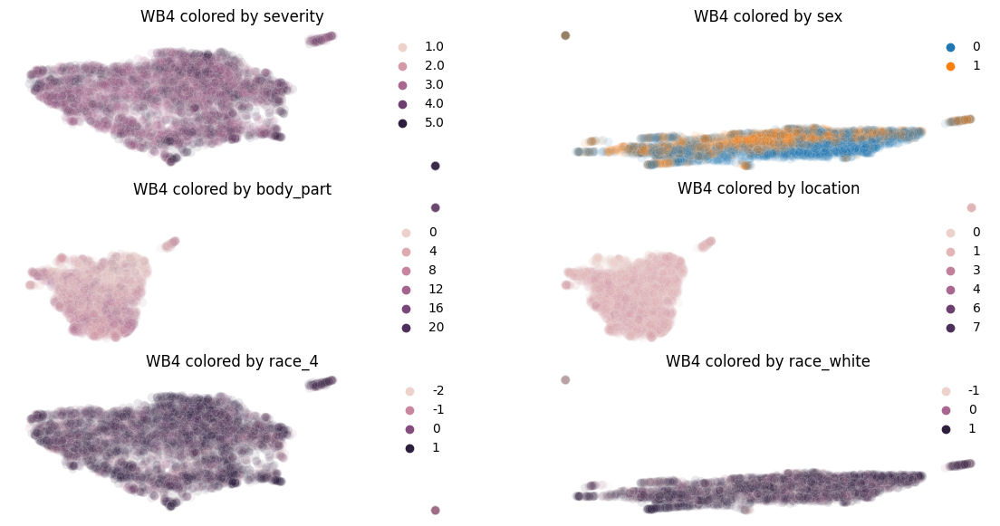

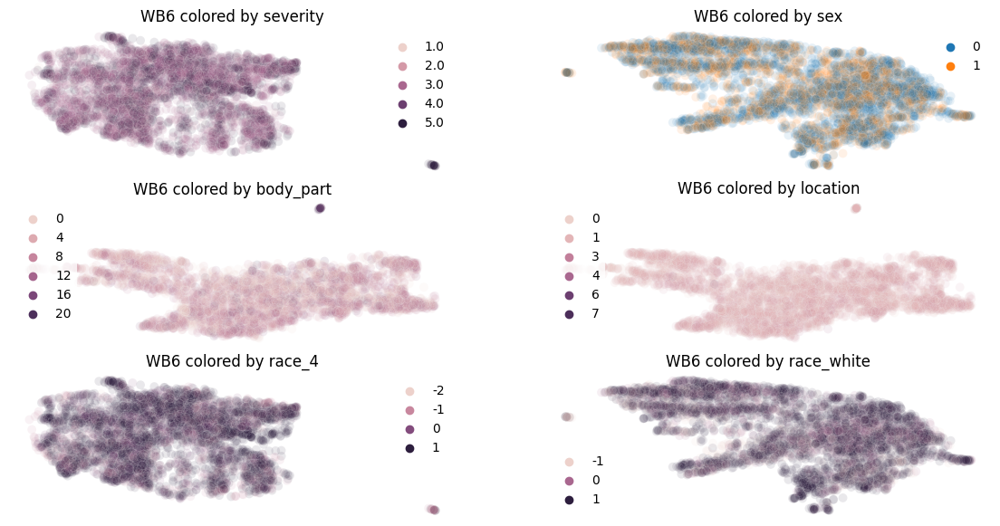

...

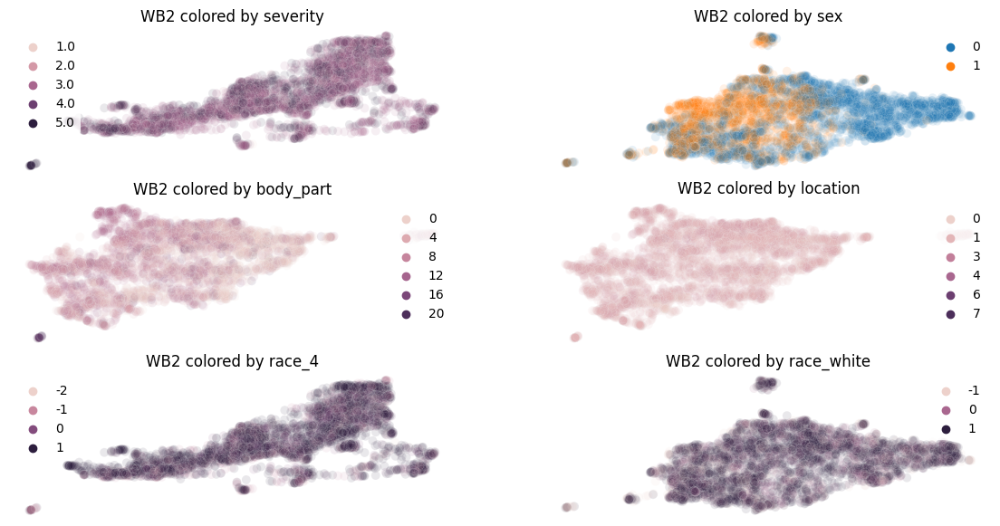

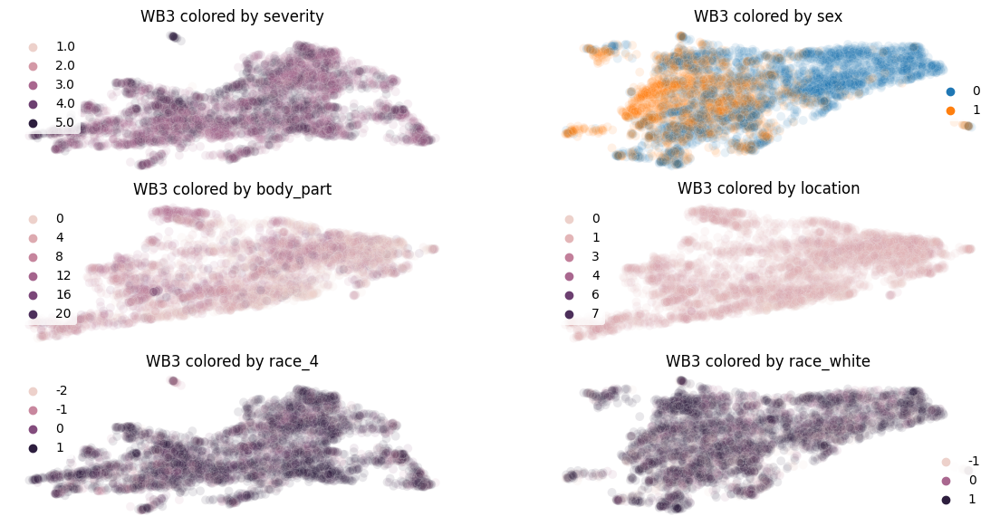

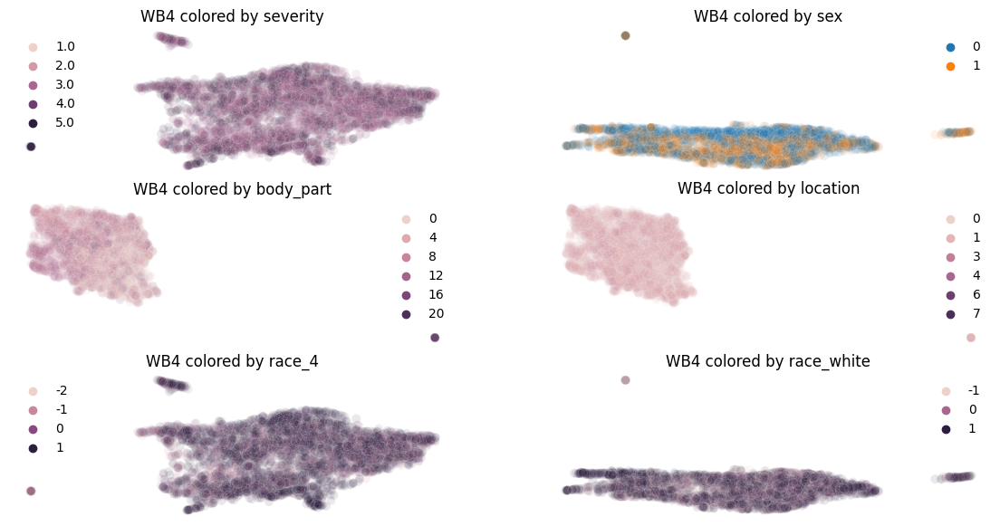

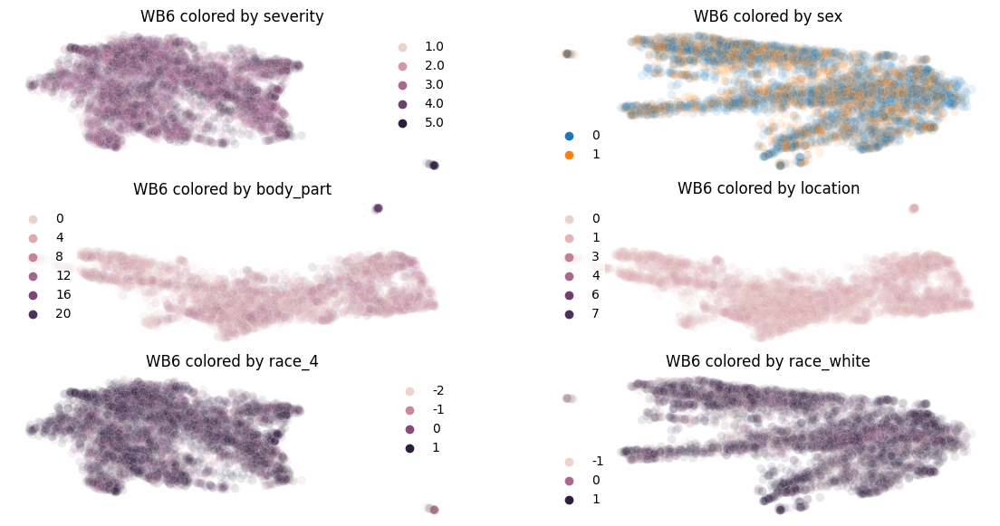

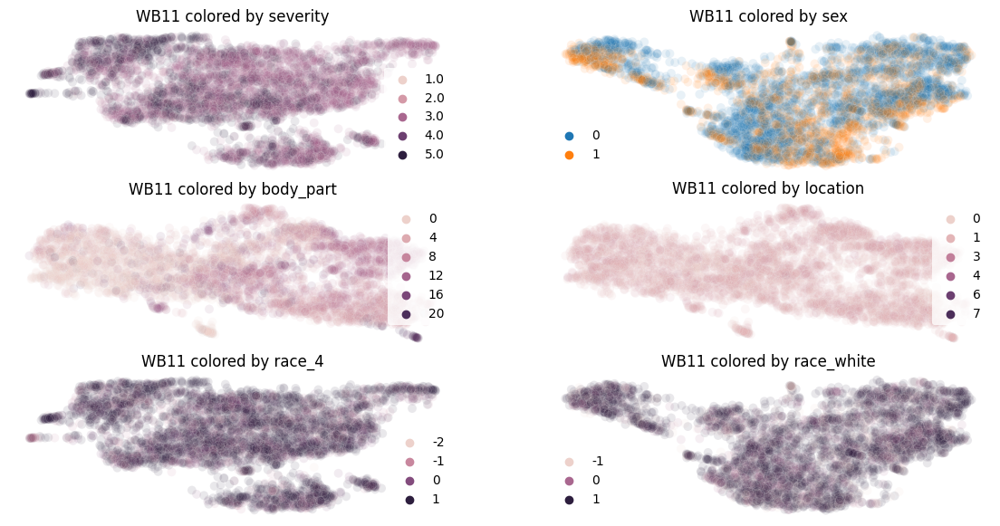

In [22]:
%%time

# same dimensions 
def show_umaps( mid, rdims ):    
    t='trn'    
    X_embedded = reducers[mid,rdims].transform( Embeddings[mid,t]  ) 
    embedded_dict = {}
    for i in range(0,X_embedded.shape[1]):
        embedded_dict[f"Dim {i+1}"] = X_embedded[:,i] 
        
    projected = pd.DataFrame( embedded_dict )   
    projected['cids']= cnums[t]

    for k in ['sex', 'age_cate_binned','body_part','location', 'diagnosis','race_white','race_4', 'severity']:
        projected[k]= surv_pols[t].to_pandas()[k]
    
    fname = 'Arial Narrow'
    tfont = {'fontname':fname, 'fontsize':12} # title font attributes
    afont = {'fontname':fname, 'fontsize':10} # axis font attributes
    lfont = {'fontname':fname, 'fontsize':8}  # legend font attributes

    def tune_figure(ax, title:str='Title'):
        ax.axis('off')
        
        title =f'WB{mid} colored by {title}'
        ax.set_title(title, **tfont)
        ax.get_legend().set_title("")
        ax.get_legend().prop.set_family(lfont['fontname'])
        ax.get_legend().prop.set_size(lfont['fontsize'])
        ax.get_legend().get_frame().set_linewidth(0.0)

    f, axs = plt.subplots(3,2,figsize=(14,7))
    try:
        axs = axs.flatten()
    except:
        pass

    d,k=3,'location'
    sns.scatterplot(data=projected, x='Dim 1', y='Dim 2', hue=k, s=50, alpha=0.1, ax=axs[d]);
    tune_figure(axs[d], k)
    
    d,k=0,'severity'
    sns.scatterplot(data=projected, x='Dim 2', y='Dim 3', hue=k, s=50, alpha=0.1, ax=axs[d]);
    tune_figure(axs[d], k)
    
    d,k=1,'sex'
    sns.scatterplot(data=projected, x='Dim 3', y='Dim 1', hue=k, s=50, alpha=0.1, ax=axs[d]);
    tune_figure(axs[d], k)
    d,k=2,'body_part'
    sns.scatterplot(data=projected, x='Dim 1', y='Dim 2', hue=k, s=50, alpha=0.1, ax=axs[d]);
    tune_figure(axs[d], k)    
    
    d,k=4,'race_4'
    sns.scatterplot(data=projected, x='Dim 2', y='Dim 3', hue=k, s=50, alpha=0.1, ax=axs[d]);
    tune_figure(axs[d], k)
    
    d,k=5,'race_white'
    sns.scatterplot(data=projected, x='Dim 3', y='Dim 1', hue=k, s=50, alpha=0.1, ax=axs[d]);
    tune_figure(axs[d], k)    
    
# viewing different combination (including 3rd and 4th dims)
[show_umaps( s, r) for r in [3, 4] for s in EMB]    

# Compute dimensionality redux on the word embeddings 

In [23]:
try:   
    word_reduced;
except:    
    word_reduced={}         
    for emb in [1,2,3,4,6,11]: 
        T = ['trn', 'val','tst']
        if emb == 11:
            T = ['trn','val']            
        if emb>0:            
            for r in [4]:
                for t in T:
                    try:
                        word_reduced[emb,t];
                    except:
                        word_reduced[emb,t] = reducers[emb,r].transform( Embeddings[emb,t])

# Examine lengths of narratives (400-word narrative only introduced in a later time period)

In [24]:
for t in ['trn','tst']:
    surv_pols[t]= surv_pols[t].with_columns([
        pol.col("narrative").str.lengths().alias("narrative_len")
    ])
    fig=px.histogram( surv_pols[t].to_pandas(),'narrative_len')
    fig.show()

# XGB optuna

In [25]:
pos_ratio = 1-np.isinf( surv_inter['trn']['label_upper_bound'] ).sum() / surv_inter['trn'].shape[0]
print( 'pos-neg-ratio:', pos_ratio,  )
#exec( open('n4.py','r').read() )

pos-neg-ratio: 0.33886255924170616


In [26]:
n_trials= (2 if INTERACTIVE else 500)
n_trials 

500

In [27]:
import optuna 
import xgboost as xgb
from sklearn.metrics import confusion_matrix
from sklearn.metrics import log_loss
from sklearn.metrics import roc_auc_score, log_loss

from datetime import date

# ====================================
# XGB/ Optuna search
# ====================================
def run_xgb_optuna( T, emb, X, surv_inter ):        
    ds = {}
    base_params = {'verbosity': 0, 
                  'objective': 'survival:aft',
                  'eval_metric': 'aft-nloglik',
                  'tree_method': 'hist'}  # Hyperparameters common to all trials
    samp_choices = ['uniform']

    for t in T:
        ds[t] = xgb.DMatrix( X[t])
        # see details https://xgboost.readthedocs.io/en/stable/tutorials/aft_survival_analysis.html            
        ds[t].set_float_info('label_lower_bound', surv_inter[t]['label_lower_bound'] )
        ds[t].set_float_info('label_upper_bound', surv_inter[t]['label_upper_bound'] )
        
    t='trn1'
    print(X['trn'][0::2,:].shape )
    ds[t] = xgb.DMatrix( X['trn'][0::2,:] )    
    ds[t].set_float_info('label_lower_bound', surv_inter['trn']['label_lower_bound'][0::2])
    ds[t].set_float_info('label_upper_bound', surv_inter['trn']['label_upper_bound'][1::2])
    t='trn2'
    ds[t] = xgb.DMatrix( X['trn'][1::2,:] )    
    ds[t].set_float_info('label_lower_bound', surv_inter['trn']['label_lower_bound'][0::2])
    ds[t].set_float_info('label_upper_bound', surv_inter['trn']['label_upper_bound'][1::2])
    
    if gpus:
        base_params.update( {'tree_method': 'gpu_hist', 'device':'cuda', } )
        samp_choices = ['gradient_based','uniform']

    def tuner(trial):
        params = {'learning_rate': trial.suggest_float('learning_rate', 0.001, 1.0),
                  'aft_loss_distribution': trial.suggest_categorical('aft_loss_distribution',
                                                                      ['normal', 'logistic', 'extreme']),
                  'aft_loss_distribution_scale': trial.suggest_float('aft_loss_distribution_scale', 0.1, 10.0),
                  'max_depth': trial.suggest_int('max_depth', 3, 10),
                  'booster': trial.suggest_categorical('booster',['gbtree','dart',]),
                  'scale_pos_weight': trial.suggest_float('scale_pos_weight', pos_ratio*0.1, 10*pos_ratio ),  # L1 reg on weights
                  'alpha': trial.suggest_float('alpha', 1e-8, 10 ),  # L1 reg on weights
                  'lambda': trial.suggest_float('lambda', 1e-8, 10 ),  # L2 reg on weights
                  'eta': trial.suggest_float('eta', 0, 1.0),  # step size
                  'sampling_method': trial.suggest_categorical('sampling_method', samp_choices ),
                  'subsample': trial.suggest_float('subsample', 0.01, 1 ),
                  'gamma': trial.suggest_float('gamma', 1e-8, 10)  # larger, more conservative; min loss reduction required to make leaf
        }
        params.update(base_params)
        pruning_callback = optuna.integration.XGBoostPruningCallback(trial, 'valid-aft-nloglik')
        bst = xgb.train(params, ds['trn1'], num_boost_round=10000,
                        evals=[(ds['trn1'], 'train'), (ds['trn2'], 'valid')],  # <---- data matrices
                        early_stopping_rounds=50, verbose_eval=False, callbacks=[pruning_callback])
        if bst.best_iteration >= 25:
            return bst.best_score
        else:
            return np.inf  # Reject models with < 25 trees

    # Run hyperparameter search
    study = optuna.create_study(direction='minimize')
    study.optimize( tuner, n_trials= n_trials )
    print('Completed hyperparameter tuning with best aft-nloglik = {}.'.format(study.best_trial.value))
    params = {}
    params.update(base_params)
    params.update(study.best_trial.params)

    print('Re-running the best trial... params = {}'.format(params))
    bst = xgb.train(params, ds['trn1'], num_boost_round=10000, verbose_eval=False,
                    evals=[(ds['trn1'], 'train'), (ds['trn2'], 'valid')],
                    early_stopping_rounds=50)    
    
    # Explore hyperparameter search space     
    fig = optuna.visualization.plot_param_importances(study)
    fig.show()
    
    for t in T:                 
        try:
            res[t]= pd.DataFrame({'Label (lower bound)': surv_inter[t]['label_lower_bound'],
                       'Label (upper bound)': surv_inter[t]['label_upper_bound'],
                       'Predicted label': bst.predict(ds[t]) } )

            sp=scipy.stats.spearmanr( res[t].iloc[:,-2], res[t].iloc[:,-1] )
            c=concordance_index_censored( event_time = time2event[t], event_indicator = event_indicator[t] , estimate=1/res[t].iloc[:,-1] )

            print(t.upper(), f'| R2:{sp[0]:.3f}; p:{sp[1]:.4} | C:{c[0]*100:.2f} ', end='|' )
            for d,h in enumerate([3,6,9,12,15,18,24,49,73, 7*24+1, 7*24*2+1, 7*24*4+1 ]):
                bs = brier_score( surv_str['trn'], surv_str[t], estimate=1/res[t].iloc[:,-1], times=[h] )
                print( end=f'{labels[d]}:{bs[1][0]:.3f} |' )
            print()
        except:
            pass
        
    today = date.today()
    bst.save_model(f'aft_model_{emb}_{today}.json')    
    return res
 
pos_ratio = 1-np.isinf( surv_inter['trn']['label_upper_bound'] ).sum() / surv_inter['trn'].shape[0]
print( 'pos-neg-ratio:', pos_ratio,  )

for mid in ['xgb',]:
    for emb in [21,22,23,24,25,26]:  # part 1 : 6,19,20, 
        X,res ={},{}    
        if emb==11:
            T=['trn','val']
        else:
            T=['trn','val','tst']
        for t in T:             
            if emb>=19:
                X[t] = np.hstack( (Embeddings[1,t],Embeddings[2,t],Embeddings[3,t], Embeddings[4,t], Embeddings[6,t] ) )                 
            else: # 1-4,6,11
                try:
                    X[t] = Embeddings[emb,t].to_numpy()                                                                                                                          
                except:
                    print(emb,'skip numpy')
                    X[t] = Embeddings[emb,t] 
            if emb == 20:
                X[t] = np.hstack( (X[t], surv_pols[t][att].to_pandas()) )
            elif emb== 25:                    
                X[t] = np.hstack( (word_reduced[1,t],word_reduced[2,t],word_reduced[3,t],word_reduced[4,t],word_reduced[6,t], surv_pols[t][att].to_pandas()  ) )
            elif emb>= 21: # dim reduced versions for comparison with Cox
                rr = emb - 20
                X[t] = np.hstack( (word_reduced[rr,t], surv_pols[t][att].to_pandas() ) )
                
        res = run_xgb_optuna( T, emb, X, surv_inter)                     

pos-neg-ratio: 0.33886255924170616


[I 2023-10-06 21:43:42,243] A new study created in memory with name: no-name-4682808a-b01b-4145-9ec1-dcef247c01c3


(2532, 17)


[I 2023-10-06 21:43:44,185] Trial 0 finished with value: inf and parameters: {'learning_rate': 0.9049772794129576, 'aft_loss_distribution': 'extreme', 'aft_loss_distribution_scale': 1.2100310283546334, 'max_depth': 5, 'booster': 'dart', 'scale_pos_weight': 1.6614849620036998, 'alpha': 8.102290145135026, 'lambda': 5.848627945524335, 'eta': 0.8646382882489344, 'sampling_method': 'uniform', 'subsample': 0.2409688324808694, 'gamma': 1.8584863568187708}. Best is trial 0 with value: inf.
[I 2023-10-06 21:43:44,287] Trial 1 finished with value: inf and parameters: {'learning_rate': 0.9057534038268443, 'aft_loss_distribution': 'normal', 'aft_loss_distribution_scale': 4.034057026339158, 'max_depth': 8, 'booster': 'gbtree', 'scale_pos_weight': 1.9411589246164256, 'alpha': 2.402075744099838, 'lambda': 5.00504256621953, 'eta': 0.375970544599874, 'sampling_method': 'gradient_based', 'subsample': 0.1395838282637169, 'gamma': 9.109754317327777}. Best is trial 0 with value: inf.
[I 2023-10-06 21:43:44

Completed hyperparameter tuning with best aft-nloglik = 4.528552789978039.
Re-running the best trial... params = {'verbosity': 0, 'objective': 'survival:aft', 'eval_metric': 'aft-nloglik', 'tree_method': 'gpu_hist', 'device': 'cuda', 'learning_rate': 0.24681624866001262, 'aft_loss_distribution': 'logistic', 'aft_loss_distribution_scale': 1.1356213545218377, 'max_depth': 7, 'booster': 'gbtree', 'scale_pos_weight': 1.951362794470557, 'alpha': 9.571041578857344, 'lambda': 5.266539616439497, 'eta': 0.8530509119206932, 'sampling_method': 'uniform', 'subsample': 0.8685372609160252, 'gamma': 3.6844194032871274}


TRN | R2:0.088; p:3.554e-10 | C:57.28 |3h:0.981 |6h:0.980 |9h:0.976 |12h:0.851 |15h:0.851 |18h:0.851 |24h:0.842 |2d:0.632 |3d:0.579 |1w:0.387 |2w:0.284 |1mo:0.219 |
VAL | R2:0.062; p:1.113e-05 | C:56.08 |3h:0.981 |6h:0.981 |9h:0.974 |12h:0.845 |15h:0.844 |18h:0.844 |24h:0.831 |2d:0.614 |3d:0.562 |1w:0.364 |2w:0.414 |1mo:0.328 |
TST | R2:0.075; p:6.5e-28 | C:56.52 |3h:0.984 |6h:0.982 |9h:0.980 |12h:0.923 |15h:0.923 |18h:0.923 |24h:0.914 |2d:0.756 |3d:0.711 |1w:0.504 |2w:0.492 |1mo:0.365 |


[I 2023-10-06 21:44:54,585] A new study created in memory with name: no-name-148669f7-8c92-4296-9bce-ffea39f9bd24


(2532, 17)


[I 2023-10-06 21:44:59,059] Trial 0 finished with value: 4.857628929216575 and parameters: {'learning_rate': 0.5167497603266672, 'aft_loss_distribution': 'extreme', 'aft_loss_distribution_scale': 8.328269640838908, 'max_depth': 3, 'booster': 'dart', 'scale_pos_weight': 1.4193816196391962, 'alpha': 5.82250267504513, 'lambda': 0.4672431155314272, 'eta': 0.3971882037994299, 'sampling_method': 'gradient_based', 'subsample': 0.5816863014413618, 'gamma': 1.38308559160283}. Best is trial 0 with value: 4.857628929216575.
[I 2023-10-06 21:46:04,086] Trial 1 finished with value: 4.876049452549619 and parameters: {'learning_rate': 0.12611987296684485, 'aft_loss_distribution': 'extreme', 'aft_loss_distribution_scale': 8.653850284930531, 'max_depth': 7, 'booster': 'dart', 'scale_pos_weight': 2.478823254519519, 'alpha': 4.249040657454204, 'lambda': 0.8933623962555602, 'eta': 0.4019406583038594, 'sampling_method': 'uniform', 'subsample': 0.19249066549630597, 'gamma': 9.178402935094935}. Best is trial

Completed hyperparameter tuning with best aft-nloglik = 4.49279276925576.
Re-running the best trial... params = {'verbosity': 0, 'objective': 'survival:aft', 'eval_metric': 'aft-nloglik', 'tree_method': 'gpu_hist', 'device': 'cuda', 'learning_rate': 0.9911048951061686, 'aft_loss_distribution': 'normal', 'aft_loss_distribution_scale': 1.5431455296694196, 'max_depth': 10, 'booster': 'gbtree', 'scale_pos_weight': 2.8670381992331637, 'alpha': 1.3891611969203232, 'lambda': 3.9942878174825136, 'eta': 0.8325150064952199, 'sampling_method': 'uniform', 'subsample': 0.4221552418137943, 'gamma': 7.575437846018898}


TRN | R2:0.058; p:3.658e-05 | C:56.08 |3h:0.977 |6h:0.976 |9h:0.972 |12h:0.848 |15h:0.848 |18h:0.848 |24h:0.839 |2d:0.631 |3d:0.578 |1w:0.387 |2w:0.283 |1mo:0.218 |
VAL | R2:0.045; p:0.001363 | C:54.46 |3h:0.977 |6h:0.976 |9h:0.970 |12h:0.842 |15h:0.841 |18h:0.841 |24h:0.828 |2d:0.613 |3d:0.561 |1w:0.364 |2w:0.413 |1mo:0.327 |
TST | R2:0.034; p:5.432e-07 | C:54.41 |3h:0.982 |6h:0.981 |9h:0.979 |12h:0.923 |15h:0.922 |18h:0.922 |24h:0.914 |2d:0.756 |3d:0.711 |1w:0.505 |2w:0.492 |1mo:0.365 |


[I 2023-10-06 21:47:50,586] A new study created in memory with name: no-name-ff444494-d40e-4298-8a25-fab22cae2163


(2532, 17)


[I 2023-10-06 21:48:14,527] Trial 0 finished with value: 4.6169638671567546 and parameters: {'learning_rate': 0.1892092941364615, 'aft_loss_distribution': 'logistic', 'aft_loss_distribution_scale': 2.1680538162900884, 'max_depth': 6, 'booster': 'dart', 'scale_pos_weight': 0.6144486232734088, 'alpha': 7.307820553708651, 'lambda': 8.976729982009182, 'eta': 0.43973030440920957, 'sampling_method': 'gradient_based', 'subsample': 0.55439735918367, 'gamma': 6.36009758034329}. Best is trial 0 with value: 4.6169638671567546.
[I 2023-10-06 21:48:14,732] Trial 1 finished with value: 4.716942073891107 and parameters: {'learning_rate': 0.2475020395478814, 'aft_loss_distribution': 'normal', 'aft_loss_distribution_scale': 6.768012356271988, 'max_depth': 10, 'booster': 'gbtree', 'scale_pos_weight': 1.6963839366287619, 'alpha': 3.409227151300961, 'lambda': 7.763728938142423, 'eta': 0.5632029464248565, 'sampling_method': 'gradient_based', 'subsample': 0.3345827048674011, 'gamma': 4.407504315593511}. Bes

Completed hyperparameter tuning with best aft-nloglik = 4.511072848210059.
Re-running the best trial... params = {'verbosity': 0, 'objective': 'survival:aft', 'eval_metric': 'aft-nloglik', 'tree_method': 'gpu_hist', 'device': 'cuda', 'learning_rate': 0.13130649430538566, 'aft_loss_distribution': 'logistic', 'aft_loss_distribution_scale': 0.8362597614219036, 'max_depth': 9, 'booster': 'gbtree', 'scale_pos_weight': 0.8771385415814326, 'alpha': 3.655019318093601, 'lambda': 7.284722975929851, 'eta': 0.5668878972612426, 'sampling_method': 'gradient_based', 'subsample': 0.3792446095000711, 'gamma': 9.005882189608434}


TRN | R2:0.064; p:5.004e-06 | C:58.23 |3h:0.975 |6h:0.974 |9h:0.970 |12h:0.846 |15h:0.846 |18h:0.846 |24h:0.837 |2d:0.630 |3d:0.577 |1w:0.386 |2w:0.283 |1mo:0.218 |
VAL | R2:0.040; p:0.00423 | C:55.83 |3h:0.975 |6h:0.975 |9h:0.968 |12h:0.840 |15h:0.840 |18h:0.840 |24h:0.826 |2d:0.611 |3d:0.560 |1w:0.363 |2w:0.412 |1mo:0.327 |
TST | R2:0.047; p:5.583e-12 | C:56.03 |3h:0.978 |6h:0.977 |9h:0.975 |12h:0.919 |15h:0.918 |18h:0.918 |24h:0.910 |2d:0.753 |3d:0.708 |1w:0.503 |2w:0.490 |1mo:0.364 |


[I 2023-10-06 21:54:24,070] A new study created in memory with name: no-name-a9998221-5130-4a83-97ef-0b8614126c6f
[I 2023-10-06 21:54:24,267] Trial 0 finished with value: 4.747634674435526 and parameters: {'learning_rate': 0.5440081064751973, 'aft_loss_distribution': 'normal', 'aft_loss_distribution_scale': 7.936783752025698, 'max_depth': 10, 'booster': 'gbtree', 'scale_pos_weight': 2.0328387660409333, 'alpha': 1.5447854152589546, 'lambda': 7.609659459385749, 'eta': 0.9621643410897421, 'sampling_method': 'uniform', 'subsample': 0.5414320413874141, 'gamma': 9.933394067108427}. Best is trial 0 with value: 4.747634674435526.


(2532, 17)


[I 2023-10-06 21:54:24,371] Trial 1 finished with value: inf and parameters: {'learning_rate': 0.4379430277976994, 'aft_loss_distribution': 'logistic', 'aft_loss_distribution_scale': 7.9378977665401935, 'max_depth': 3, 'booster': 'gbtree', 'scale_pos_weight': 1.0958730982408924, 'alpha': 4.507107392224979, 'lambda': 5.603023702592698, 'eta': 0.044777540211378475, 'sampling_method': 'gradient_based', 'subsample': 0.12262681295015675, 'gamma': 2.254107709232448}. Best is trial 0 with value: 4.747634674435526.
[I 2023-10-06 21:54:24,600] Trial 2 finished with value: 4.7727487714134105 and parameters: {'learning_rate': 0.7004862976625272, 'aft_loss_distribution': 'normal', 'aft_loss_distribution_scale': 8.994471093925833, 'max_depth': 6, 'booster': 'gbtree', 'scale_pos_weight': 1.7990283365335524, 'alpha': 7.821411750695446, 'lambda': 4.175304833812754, 'eta': 0.7703388755646641, 'sampling_method': 'gradient_based', 'subsample': 0.46193711243631974, 'gamma': 3.730363695042306}. Best is tri

Completed hyperparameter tuning with best aft-nloglik = 4.49392383926926.
Re-running the best trial... params = {'verbosity': 0, 'objective': 'survival:aft', 'eval_metric': 'aft-nloglik', 'tree_method': 'gpu_hist', 'device': 'cuda', 'learning_rate': 0.9976163924308579, 'aft_loss_distribution': 'normal', 'aft_loss_distribution_scale': 1.4177129525950933, 'max_depth': 10, 'booster': 'gbtree', 'scale_pos_weight': 1.6370581408270468, 'alpha': 7.101970187063255, 'lambda': 8.44371749048187, 'eta': 0.3552347897033276, 'sampling_method': 'uniform', 'subsample': 0.8492264951920481, 'gamma': 5.404846188655134}


TRN | R2:0.087; p:4.642e-10 | C:60.00 |3h:0.976 |6h:0.976 |9h:0.971 |12h:0.848 |15h:0.848 |18h:0.848 |24h:0.839 |2d:0.631 |3d:0.578 |1w:0.387 |2w:0.283 |1mo:0.218 |
VAL | R2:0.059; p:2.304e-05 | C:58.37 |3h:0.976 |6h:0.976 |9h:0.969 |12h:0.842 |15h:0.842 |18h:0.842 |24h:0.828 |2d:0.613 |3d:0.561 |1w:0.364 |2w:0.413 |1mo:0.327 |
TST | R2:0.097; p:1.462e-45 | C:59.23 |3h:0.980 |6h:0.979 |9h:0.977 |12h:0.921 |15h:0.920 |18h:0.920 |24h:0.911 |2d:0.755 |3d:0.710 |1w:0.504 |2w:0.491 |1mo:0.365 |


[I 2023-10-06 21:56:21,478] A new study created in memory with name: no-name-92f9aefa-b0f2-4fc2-aca7-c87844f300d1
[I 2023-10-06 21:56:21,628] Trial 0 finished with value: inf and parameters: {'learning_rate': 0.8979148231897799, 'aft_loss_distribution': 'normal', 'aft_loss_distribution_scale': 4.4332201501627795, 'max_depth': 6, 'booster': 'gbtree', 'scale_pos_weight': 0.4914334346525737, 'alpha': 2.2075702631559886, 'lambda': 0.6306146612576281, 'eta': 0.6859308571938794, 'sampling_method': 'gradient_based', 'subsample': 0.0915016134262222, 'gamma': 5.547808967983775}. Best is trial 0 with value: inf.


(2532, 33)


[I 2023-10-06 21:56:21,774] Trial 1 finished with value: 4.517544672944869 and parameters: {'learning_rate': 0.15271733442848665, 'aft_loss_distribution': 'normal', 'aft_loss_distribution_scale': 1.4919629848723401, 'max_depth': 3, 'booster': 'gbtree', 'scale_pos_weight': 0.22830789097645532, 'alpha': 4.212869621343225, 'lambda': 1.7635676650117655, 'eta': 0.7106874854352917, 'sampling_method': 'uniform', 'subsample': 0.08034553847103477, 'gamma': 0.9664807108793936}. Best is trial 1 with value: 4.517544672944869.
[I 2023-10-06 21:56:21,851] Trial 2 finished with value: inf and parameters: {'learning_rate': 0.7911814688248268, 'aft_loss_distribution': 'extreme', 'aft_loss_distribution_scale': 6.007876327634175, 'max_depth': 10, 'booster': 'gbtree', 'scale_pos_weight': 1.210990710938118, 'alpha': 7.945407815947013, 'lambda': 1.0598695637576954, 'eta': 0.7207005349255488, 'sampling_method': 'uniform', 'subsample': 0.6711011620137233, 'gamma': 0.1143165622821552}. Best is trial 1 with val

Completed hyperparameter tuning with best aft-nloglik = 4.494952943708664.
Re-running the best trial... params = {'verbosity': 0, 'objective': 'survival:aft', 'eval_metric': 'aft-nloglik', 'tree_method': 'gpu_hist', 'device': 'cuda', 'learning_rate': 0.9689859576747895, 'aft_loss_distribution': 'normal', 'aft_loss_distribution_scale': 1.4522757255413996, 'max_depth': 10, 'booster': 'dart', 'scale_pos_weight': 0.9498672058364664, 'alpha': 9.96710180328053, 'lambda': 1.2589650716328689, 'eta': 0.29290946982718896, 'sampling_method': 'uniform', 'subsample': 0.04628892448623258, 'gamma': 4.270887021858643}


[W 2023-10-06 22:02:34,516] Trial 0 is omitted in visualization because its objective value is inf or nan.
[W 2023-10-06 22:02:34,517] Trial 2 is omitted in visualization because its objective value is inf or nan.
[W 2023-10-06 22:02:34,518] Trial 13 is omitted in visualization because its objective value is inf or nan.
[W 2023-10-06 22:02:34,519] Trial 18 is omitted in visualization because its objective value is inf or nan.
[W 2023-10-06 22:02:34,520] Trial 31 is omitted in visualization because its objective value is inf or nan.
[W 2023-10-06 22:02:34,521] Trial 32 is omitted in visualization because its objective value is inf or nan.
[W 2023-10-06 22:02:34,522] Trial 33 is omitted in visualization because its objective value is inf or nan.
[W 2023-10-06 22:02:34,523] Trial 36 is omitted in visualization because its objective value is inf or nan.
[W 2023-10-06 22:02:34,523] Trial 59 is omitted in visualization because its objective value is inf or nan.
[W 2023-10-06 22:02:34,524] Tr

TRN | R2:0.047; p:0.0008272 | C:60.81 |3h:0.976 |6h:0.975 |9h:0.971 |12h:0.848 |15h:0.848 |18h:0.848 |24h:0.839 |2d:0.631 |3d:0.578 |1w:0.387 |2w:0.283 |1mo:0.218 |
VAL | R2:0.063; p:7.619e-06 | C:61.66 |3h:0.975 |6h:0.975 |9h:0.968 |12h:0.842 |15h:0.841 |18h:0.841 |24h:0.828 |2d:0.613 |3d:0.561 |1w:0.364 |2w:0.413 |1mo:0.328 |
TST | R2:0.071; p:2.846e-25 | C:63.73 |3h:0.978 |6h:0.977 |9h:0.974 |12h:0.920 |15h:0.919 |18h:0.919 |24h:0.911 |2d:0.754 |3d:0.709 |1w:0.503 |2w:0.491 |1mo:0.364 |


[I 2023-10-06 22:02:38,414] A new study created in memory with name: no-name-5b689676-bfd2-41f4-b453-d4adf5ca3764


(2532, 17)


[I 2023-10-06 22:03:18,474] Trial 0 finished with value: 4.731403956460111 and parameters: {'learning_rate': 0.09544802428188656, 'aft_loss_distribution': 'normal', 'aft_loss_distribution_scale': 7.261466355953966, 'max_depth': 6, 'booster': 'dart', 'scale_pos_weight': 1.4877982933942018, 'alpha': 5.685556682061593, 'lambda': 9.222463503493062, 'eta': 0.04684602262945159, 'sampling_method': 'gradient_based', 'subsample': 0.4414021349784895, 'gamma': 6.178613217840055}. Best is trial 0 with value: 4.731403956460111.
[I 2023-10-06 22:03:43,020] Trial 1 finished with value: 4.789718947315082 and parameters: {'learning_rate': 0.5786886680839104, 'aft_loss_distribution': 'normal', 'aft_loss_distribution_scale': 9.735862351033111, 'max_depth': 6, 'booster': 'dart', 'scale_pos_weight': 1.5587110460946358, 'alpha': 8.858328557576286, 'lambda': 7.92775217903461, 'eta': 0.9753812157747215, 'sampling_method': 'gradient_based', 'subsample': 0.46823887927751245, 'gamma': 3.8370136173261806}. Best i

Completed hyperparameter tuning with best aft-nloglik = 4.522881474648419.
Re-running the best trial... params = {'verbosity': 0, 'objective': 'survival:aft', 'eval_metric': 'aft-nloglik', 'tree_method': 'gpu_hist', 'device': 'cuda', 'learning_rate': 0.9521635094307771, 'aft_loss_distribution': 'normal', 'aft_loss_distribution_scale': 1.9966147988882272, 'max_depth': 10, 'booster': 'dart', 'scale_pos_weight': 0.32525982771158946, 'alpha': 6.707275438387379, 'lambda': 1.7738689606574327, 'eta': 0.10927801907719556, 'sampling_method': 'uniform', 'subsample': 0.3670587305550421, 'gamma': 7.876232216941093}


[W 2023-10-06 22:11:34,268] Trial 4 is omitted in visualization because its objective value is inf or nan.
[W 2023-10-06 22:11:34,269] Trial 5 is omitted in visualization because its objective value is inf or nan.
[W 2023-10-06 22:11:34,270] Trial 10 is omitted in visualization because its objective value is inf or nan.
[W 2023-10-06 22:11:34,271] Trial 15 is omitted in visualization because its objective value is inf or nan.
[W 2023-10-06 22:11:34,272] Trial 20 is omitted in visualization because its objective value is inf or nan.
[W 2023-10-06 22:11:34,273] Trial 53 is omitted in visualization because its objective value is inf or nan.
[W 2023-10-06 22:11:34,274] Trial 54 is omitted in visualization because its objective value is inf or nan.
[W 2023-10-06 22:11:34,275] Trial 66 is omitted in visualization because its objective value is inf or nan.
[W 2023-10-06 22:11:34,276] Trial 90 is omitted in visualization because its objective value is inf or nan.
[W 2023-10-06 22:11:34,277] Tr

TRN | R2:0.087; p:6.992e-10 | C:69.18 |3h:0.982 |6h:0.982 |9h:0.977 |12h:0.855 |15h:0.855 |18h:0.855 |24h:0.846 |2d:0.638 |3d:0.584 |1w:0.391 |2w:0.286 |1mo:0.221 |
VAL | R2:0.091; p:9.321e-11 | C:68.76 |3h:0.982 |6h:0.981 |9h:0.975 |12h:0.849 |15h:0.848 |18h:0.848 |24h:0.834 |2d:0.619 |3d:0.566 |1w:0.368 |2w:0.417 |1mo:0.330 |
TST | R2:0.096; p:3.129e-45 | C:69.96 |3h:0.985 |6h:0.983 |9h:0.981 |12h:0.927 |15h:0.927 |18h:0.927 |24h:0.918 |2d:0.762 |3d:0.716 |1w:0.509 |2w:0.496 |1mo:0.368 |


# Compute dimensionally-reduced word embeddings + Cox regression analysis


Attribute subsets
att1: ['location', 'product_1', 'product_2', 'product_3', 'body_part', 'drug', 'alcohol', 'sex', 'age_cate_binned', 'year', 'month', 'time2hosp', 'severity'] 
att2: ['location', 'product_1', 'product_2', 'product_3', 'body_part', 'drug', 'alcohol', 'sex', 'age_cate_binned', 'race_recoded', 'year', 'month', 'time2hosp', 'severity']
---------------------------------------------------------------------------------------------------- -1 


InputSet-1
 TRN | R2:0.184; p:1.127e-39 | C:58.22 
3h:0.997 | 6h:0.996 | 9h:0.991 | 12h:0.858 | 15h:0.855 | 18h:0.855 | 24h:0.845 | 2d:0.635 | 3d:0.580 | 1w:0.388 | 	0.576
InputSet-1
 VAL | R2:0.156; p:4.632e-29 | C:57.99 
3h:0.998 | 6h:0.996 | 9h:0.989 | 12h:0.853 | 15h:0.849 | 18h:0.849 | 24h:0.833 | 2d:0.616 | 3d:0.563 | 1w:0.364 | 	0.565
InputSet-1
 TST | R2:0.148; p:7.304e-105 | C:55.31 
3h:1.000 | 6h:0.998 | 9h:0.996 | 12h:0.932 | 15h:0.928 | 18h:0.928 | 24h:0.917 | 2d:0.759 | 3d:0.712 | 1w:0.505 | 	0.559





<lifelines.CoxPHFitter: fitted with 5064 total observations, 0 right-censored observations>
             duration col = 'time2hosp'
                event col = 'severity'
                penalizer = [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
                 l1 ratio = 0.1
      baseline estimation = breslow
   number of observations = 5064
number of events observed = 5064
   partial log-likelihood = -38076.04
         time fit was run = 2023-10-06 22:11:41 UTC

---
                  coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                               
location         -0.16       0.86       0.02            -0.20            -0.11                 0.82                 0.89
product_1        -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
product_2        -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
product_3        -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
body_part        -0.01       0.99       0.00            -0.02            -0.01                 0.98                 0.99
drug             -0.02       0.98       0.06            -0.13             0.10                 0.88                 1.10
alcohol           0.28       1.32       0.09             0.10             0.46                 1.10                 1.58
sex              -0.00       1.00       0.02            -0.05             0.05                 0.95                 1.05
age_cate_binned   0.07       1.08       0.02             0.04             0.10                 1.05                 1.11
race_recoded     -0.00       1.00       0.00            -0.01             0.01                 0.99                 1.01
year             -0.00       1.00       0.01            -0.03             0.02                 0.97                 1.02
month             0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00

                  cmp to     z      p   -log2(p)
covariate                                       
location            0.00 -6.89 <0.005      37.36
product_1           0.00 -0.01   0.99       0.01
product_2           0.00 -0.39   0.69       0.53
product_3           0.00 -0.08   0.94       0.10
body_part           0.00 -5.05 <0.005      21.13
drug                0.00 -0.27   0.79       0.34
alcohol             0.00  3.03 <0.005       8.68
sex                 0.00 -0.00   1.00       0.00
age_cate_binned     0.00  4.94 <0.005      20.32
race_recoded        0.00 -0.01   1.00       0.01
year                0.00 -0.27   0.78       0.35
month               0.00  0.00   1.00       0.00
---
Concordance = 0.58
Partial AIC = 76176.07
log-likelihood ratio test = 121.24 on 12 df
-log2(p) of ll-ratio test = 64.63

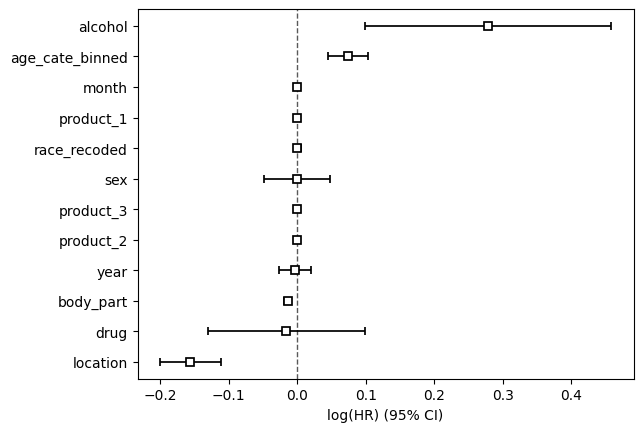

<Figure size 640x480 with 0 Axes>

In [28]:
%matplotlib inline
from lifelines import AalenAdditiveFitter, CoxPHFitter
att =['location','product_1','product_2','product_3','fire_involvement','body_part','drug','alcohol', 'sex', 'age_cate_binned','race_recoded','year','month']

att1=att.copy() # without race
att1+=['time2hosp', 'severity']
att1.remove('fire_involvement')            
att1.remove('race_recoded')

att2=att.copy()  # with race
att2+=['time2hosp', 'severity']
att2.remove('fire_involvement')            
print( 'Attribute subsets\natt1:',att1, '\natt2:', att2 )

import sksurv 
import matplotlib.pyplot as plt
from sksurv.util import Surv
from lifelines import CoxPHFitter
from IPython.core.display import HTML
from IPython.display import display


from lifelines.utils import k_fold_cross_validation

def run_cox():
    cphs={}
    for emb in [-1,0,1,2,3,4,6,11]: 
        T = ['trn', 'val','tst']
        if emb == 11:
            T = ['trn','val']
            
        TIMES = [3,6,9,12,15,18,24,49,73, 7*24+1, 7*24*2+1, 7*24*4+1 ]
        trn_event_times = np.array(surv_pols['trn']['time2hosp'].unique())

        M = len(trn_event_times)
        
        a=np.broadcast_to( trn_event_times[:, np.newaxis], (M, len(TIMES)) )
        b=np.broadcast_to( TIMES, (M, len(TIMES) ) )
        Q=np.unique( np.argmin( (a - b)**2 ,axis=1))
        
        print('-'*100, emb, '\n\n')           
        for t in T:    
            if emb==-1:
                A = att2
            else:
                A = att1
            XX =surv_pols[t].to_pandas()[A] *1. 

            if emb>0:
                XX = pd.DataFrame( np.hstack( (XX, word_reduced[emb,t]) ), columns=A +['w1','w2','w3', 'w4'] ) 

            if t == 'trn':
                penalty = np.ones( XX.shape[1]-2 )*.1      
                
                aaf_1 = AalenAdditiveFitter(coef_penalizer=0.5)
                aaf_2 = AalenAdditiveFitter(coef_penalizer=10)
                cph = CoxPHFitter(penalizer=penalty, l1_ratio=.1)
                
                if 0:
                    print(np.mean(k_fold_cross_validation(cph, XX, duration_col='time2hosp', event_col='severity',)))# scoring_method="concordance_index")))
                    print(np.mean(k_fold_cross_validation(aaf_1, XX, duration_col='time2hosp', event_col='severity',)))# scoring_method="concordance_index")))
                    print(np.mean(k_fold_cross_validation(aaf_2, XX, duration_col='time2hosp', event_col='severity',)))# scoring_method="concordance_index")))

                cphs[emb] = CoxPHFitter(penalizer=penalty, l1_ratio=.1)
                cphs[emb].fit(XX, 'time2hosp', 'severity')
                
            preds = cphs[emb].predict_cumulative_hazard( XX ).iloc[Q,:]    
            c=concordance_index_censored(event_time = time2event[t], 
                                         event_indicator = event_indicator[t],
                                         estimate=preds.iloc[-1,:] )
            
            sp=scipy.stats.spearmanr( np.array( XX['time2hosp']), 1/ preds.iloc[-1,:].values  )            

            print(f'InputSet{emb}\n', t.upper(), f'| R2:{sp[0]:.3f}; p:{sp[1]:.4} | C:{c[0]*100:.2f} ', )

            for d,(ii,h) in enumerate(zip(Q,TIMES)):
                try:
                    bs = brier_score( surv_str['trn'], surv_str[t], estimate= preds.iloc[ii,:], times=[h] )
                    print( end=f'{labels[d]}:{bs[1][0]:.3f} | ' )
                except:
                    pass
            c=cphs[emb].score( XX,'concordance_index')
            print( f'\t{c:.3f}' )
        print('\n\n')
        cphs[emb].print_summary()
        cphs[emb].plot()
        plt.figure()
        return cphs       

cphs = run_cox()        

# Clean up static resources to save persistent storage quota (on Kaggle)

In [30]:
!rm *.h5 *xlsx *gzip